In [ ]:
!pip install datasets

# standard
import copy
import datasets
from datasets import load_dataset, load_from_disk
from IPython.display import Image
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# custom
from helper_files.displays import *
from helper_files.feature_extraction import *
from helper_files.image_preprocessing import *
from helper_files.model_and_cm import model_and_CM, custom_cv
from helper_files.utils import save_dataset_to_local, remove_classes
from helper_files.run_model import run_model

# Computer Vision related
from skimage.color import rgb2gray
from skimage.feature import hog, graycomatrix, graycoprops
from skimage import data, exposure
from sklearn.manifold import TSNE

# sklearn models
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler

# metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
import time
import pickle

# resnet
from torch import nn
import torchvision.models as models
from torchsummary import summary
from torchvision import transforms
from PIL import Image


In [3]:
config = '320px'

WRITE = True

if WRITE:
  save_dataset_to_local('datasets/local_dataset_'+config, config = config, train_val_split=0.15)
else:
  pass
# Load in data
datasetDict = load_from_disk('datasets/local_dataset_'+config)

# Load in labels. note: label_dict is formatted {class_num: 'class_name'} e.g. 0: 'fish'
label_dict = dict(zip(range(10), datasetDict['train'].features['label'].int2str(range(10))))

# Remove unwanted classes (Church, Parachute and Cassette Player)
datasetDict, label_dict = remove_classes(datasetDict, [2, 4, 9])

# Convert datasets to output numpy
datasetDict = datasetDict.with_format('np')

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Map:   0%|          | 0/8048 [00:00<?, ? examples/s]

Map:   0%|          | 0/1421 [00:00<?, ? examples/s]

Saving the dataset (0/4 shards):   0%|          | 0/8048 [00:00<?, ? examples/s]

Saving the dataset (0/2 shards):   0%|          | 0/3925 [00:00<?, ? examples/s]

Saving the dataset (0/1 shards):   0%|          | 0/1421 [00:00<?, ? examples/s]

Filter:   0%|          | 0/8048 [00:00<?, ? examples/s]

Filter:   0%|          | 0/1421 [00:00<?, ? examples/s]

Flattening the indices:   0%|          | 0/5588 [00:00<?, ? examples/s]

This is what the datasetDict looks like

In [3]:
datasetDict

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 5588
    })
    test: Dataset({
        features: ['image', 'label'],
        num_rows: 2769
    })
    validation: Dataset({
        features: ['image', 'label'],
        num_rows: 987
    })
})

Format of the label_dict is as follows

In [4]:
label_dict

{0: 'tench',
 1: 'English springer',
 3: 'chain saw',
 5: 'French horn',
 6: 'garbage truck',
 7: 'gas pump',
 8: 'golf ball'}

In order to maintain consistency across our image feature extraction methods, we used the 320px formatted images from the original dataset as our starting data. The lengths of the other sides of the 320px data ranged from 320px to 1588px, meaning that our smallest image was 320px by 320px and our largest image was 320px by 1588px before pre-processing.

We first resized each image to be 256px by 256px by scaling down the images and then center cropped to 224px by 224px, so all images were the same size. The center crop aimed to keep the most informative part of the image while removing the periphery along the borders. We also normalized each image on a 0 to 255 uint8 scale.

The steps of resizing,  center-cropping, and normalizing were chosen because these were the steps necessary for the ResNet feature extraction.

However, GLCM required grayscale and HOG required a single channel so we converted the images to grayscale, which is the only difference in image preprocessing for the different feature extractions.

In [4]:
### Transforming functions: comment out as necessary. See image_preprocessing.py for details.
def transform_dataset(dset):
    ## resize is based on the configured pixel dimension (e.g. 160 or 320 pix) You can put in a single dimension to make a rescaled square
    dset['image'] = [resize_img(img, config=256) for img in dset['image']] # scales image to new dimensions

    ## crops based on smallest dimension, applies to the center of the image
    dset['image'] = [center_crop(img, dim=224) for img in dset['image']] # center crop

    ## dataset is loaded as RGB, converts to single channel gray scale
    dset['image'] = [to_gray_img(img) for img in dset['image']] #gray scale

    ## apply min/max normalization
    dset['image'] = [normalize_image(img) for img in dset['image']] # normalize values

    return dset


In [5]:
# Apply transform_dataset for the three datasets, train, test and val and it will be applied in batches

train, test, val = [datasetDict[dataset].map(transform_dataset, batched=True, batch_size=250, writer_batch_size=250) for dataset in datasetDict]




Map:   0%|          | 0/5588 [00:00<?, ? examples/s]

/usr/local/lib/python3.10/dist-packages/datasets/features/image.py:348: UserWarning: Downcasting array dtype int64 to int32 to be compatible with 'Pillow'
  warnings.warn(f"Downcasting array dtype {dtype} to {dest_dtype} to be compatible with 'Pillow'")


Map:   0%|          | 0/987 [00:00<?, ? examples/s]

Below is a visualization of the distribution of classes between the train, validation and test sets

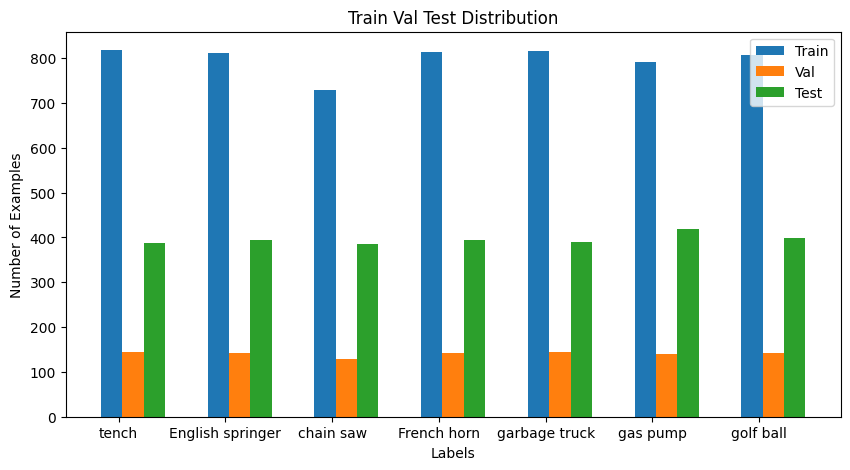

In [7]:
dataset_distribution_plot(train, test, val, label_dict)

#Principal Component Analysis (PCA)
PCA is a linear dimensionality reduction method which serves image classification well because it reduces the amount of dimensions needed to represent an image yet maintains discriminability and variation within the image for continued classification power. This reduction in dimensionality may reveal dominant features that provide power and discriminability power to image classification. We will apply PCA to our features.

# HOG Feature Extraction
We chose to use HOG for our first feature extraction method given it is widely used in object detection, as it provides useful information about an object’s shape. The HOG method uses the angles and magnitudes of the gradients within localized regions of an image to create its features. We hoped HOG would be able to pick up on the circular structure of a golf ball and the rectangular form of a garbage truck, to improve classification. Below is a visualization of the HOG features for the first image of each class.


PCA was applied to the HOG features. The PCA plot of explained variance below, shows that 173 features accounted for 90% of the explained variance. Using the 173 features is a large reduction from the original 1800 features.




Completed HOG calc
Retrieved samples


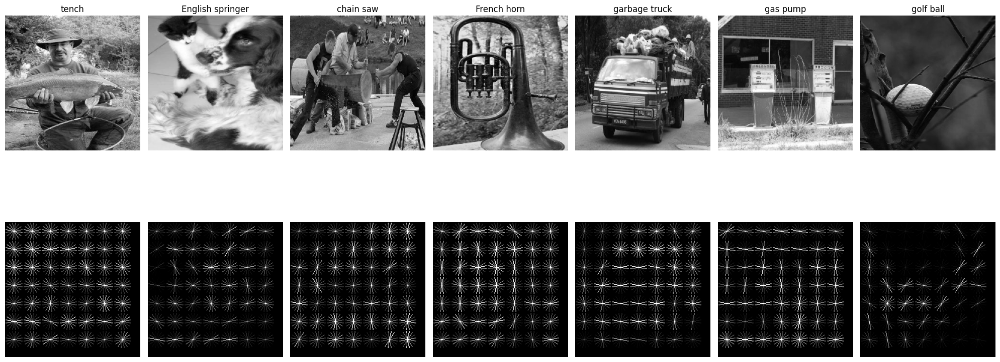

Completed HOG calc
Completed HOG calc


In [11]:
train_hog, h_train = HOG(train, label_dict, orientations=8, pixels_per_cell=(30,30), cells_per_block=(3,3), plot_hog=True, plot_feature_vector = False)
val_hog, h_val = HOG(val, label_dict, orientations=8, pixels_per_cell=(30,30), cells_per_block=(3,3), plot_hog=False, plot_feature_vector = False)
test_hog, h_test = HOG(test, label_dict, orientations=8, pixels_per_cell=(30,30), cells_per_block=(3,3),plot_hog=False, plot_feature_vector = False)

Total Explained Variance: 7.5791
Total Explained Variance Ratio: 1.0000
Original Number of Components: (5588, 1800)
Number of principal components for 90% explained variance: 173


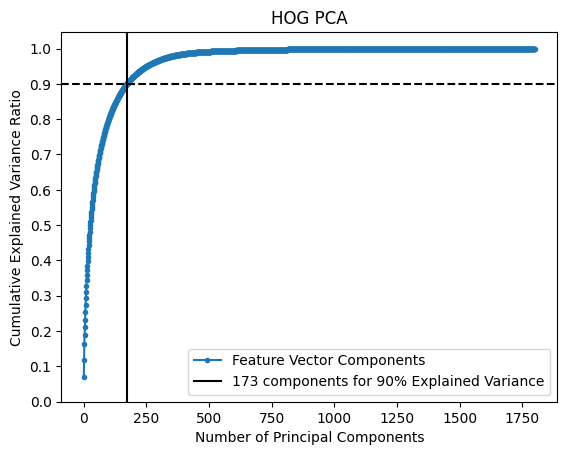

In [12]:
pca, minimum_components_90 = pca_explained_variance(train_hog, title='HOG', n_components=None, plot=True, details=True)
to_transform = [train_hog, val_hog, test_hog]
train_hog_pca, val_hog_pca, test_hog_pca = [pca.transform(dataset_features)[:, :minimum_components_90] for dataset_features in to_transform]

Below we have the t-SNE plots for the HOG features with no feature reduction and with feature reduction applied. There is no distinct, separation between groups but the features are partially promising, as we see the gas pump with PCA applied seems to have formed a distinct group.



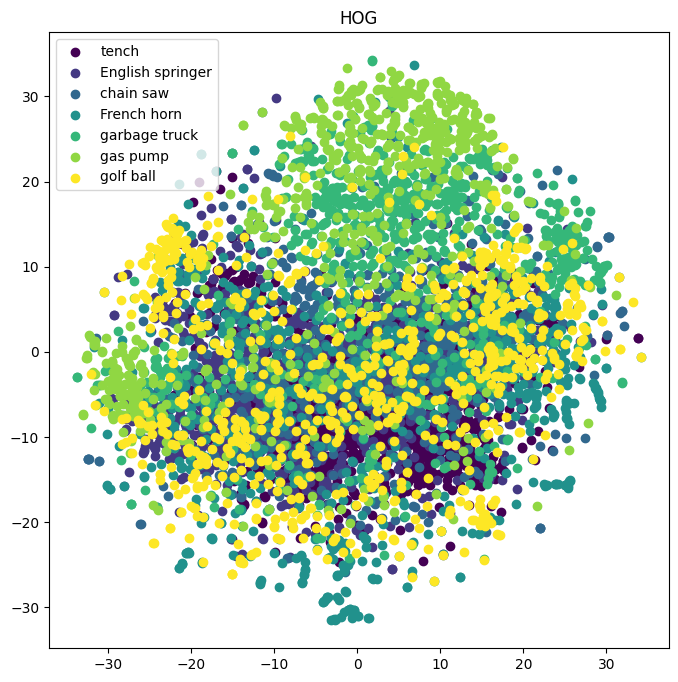

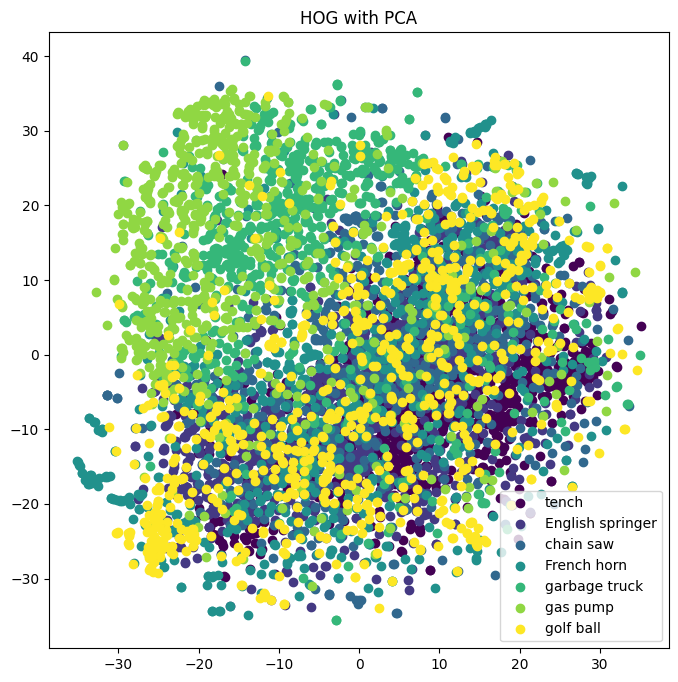

In [10]:
features = [train_hog, train_hog_pca]
title = ['HOG', 'HOG with PCA']
targets = train['label']

for i, feature in enumerate(features):
    tsne_plot(feature, targets, label_dict, title[i])

# Classifiers
We will use the output from our feature extraction method, HOG, and HOG with PCA, as input features for **Logistic Regression**, **Support Vector Machine**, and **Random Forest**.

*   Logistic Regression is a simple implementation and both the implementation and results are easily interpretable. With the help of the softmax function, we can use logistic regression to predict the probability distribution across all classes.

*   Support Vector Machine (SVM) aims to create a hyperplane that maximizes the separation between classes. It is robust and is claimed to perform well on relatively small datasets.

*   The Random Forest algorithm is an ensemble method that employs both bagging and feature randomness to create an uncorrelated forest of decision trees. Random Forest is very efficient and are cited as being able to handle high dimensional data well, it can be prone to overfitting when generalized to multinomial classification.



### Classifier Results

Random Forest was evidently overfitted, as our accuracy for training was 1.0 and then drops to 48% for validation for full dimensionality of features and reduced features.

There doesn't seem to be much of a difference between HOG with all dimensions and with PCA applied for logistic regression and SVM. We see that the training accuracies are initially around 60% and then obtain validation accuracies hardly better than a coin flip.


Our first runs use a "custom_cv" when defining the model_dict. This is essentially a CV = 1, which is a dedicated train and validation set, to get initial results for each model with default parameters.

In [13]:
# Define the models we will use.
model_dict = {
            'Logistic Regression':   {'estimator': LogisticRegression(),
                                      'cv': 'custom_cv'
                                      },
              'SVM':           {'estimator': SVC(),
                                'cv': 'custom_cv',
                                },
              'Random Forest': {'estimator': RandomForestClassifier(),

                                'cv': 'custom_cv'
                                },
              }


Below we can see the extracted features from HOG don't yield great accuracies for the classifiers, where the training data has accuracies about 20-50 percentage points higher than the validation data. This suggests our model is not generalizable nor does it have good prediction power, at least with these features.

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Logistic Regression training time: 11.78 seconds
The Logistic Regression Training - HOG is 67.9% accurate
The Logistic Regression Validation - HOG is 56.74% accurate
SVM training time: 51.15 seconds
The SVM Training - HOG is 87.76% accurate
The SVM Validation - HOG is 63.22% accurate
Random Forest training time: 25.89 seconds
The Random Forest Training - HOG is 100.0% accurate
The Random Forest Validation - HOG is 53.7% accurate
Logistic Regression training time: 0.62 seconds
The Logistic Regression Training - HOG with PCA is 62.51% accurate
The Logistic Regression Validation - HOG with PCA is 57.35% accurate
SVM training time: 6.18 seconds
The SVM Training - HOG with PCA is 87.4% accurate
The SVM Validation - HOG with PCA is 64.13% accurate
Random Forest training time: 10.06 seconds
The Random Forest Training - HOG with PCA is 100.0% accurate
The Random Forest Validation - HOG with PCA is 52.68% accurate


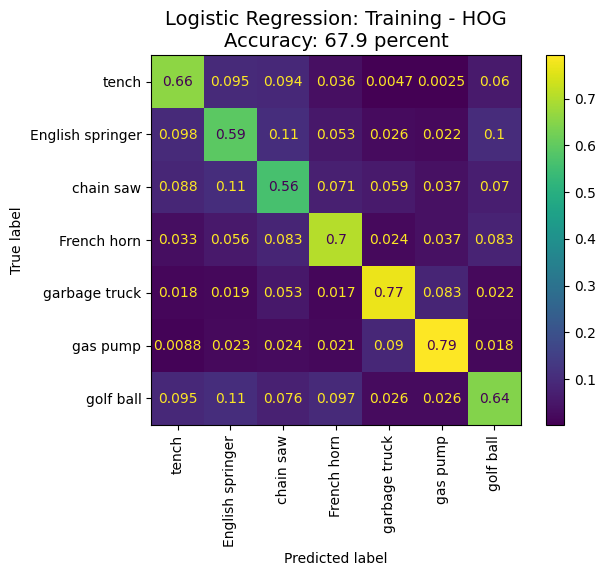

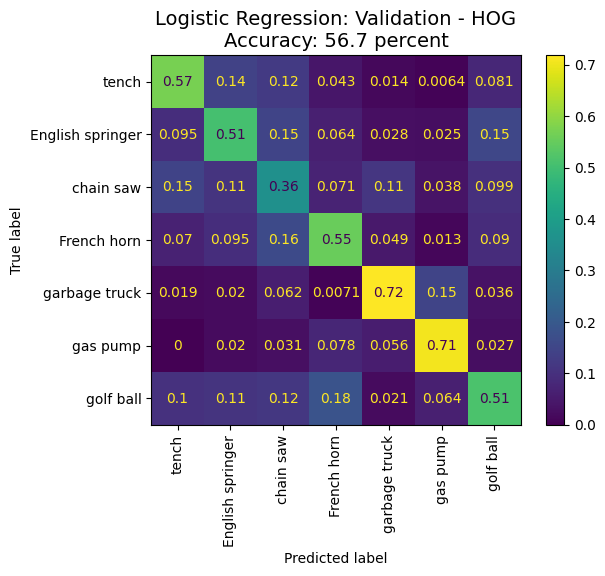

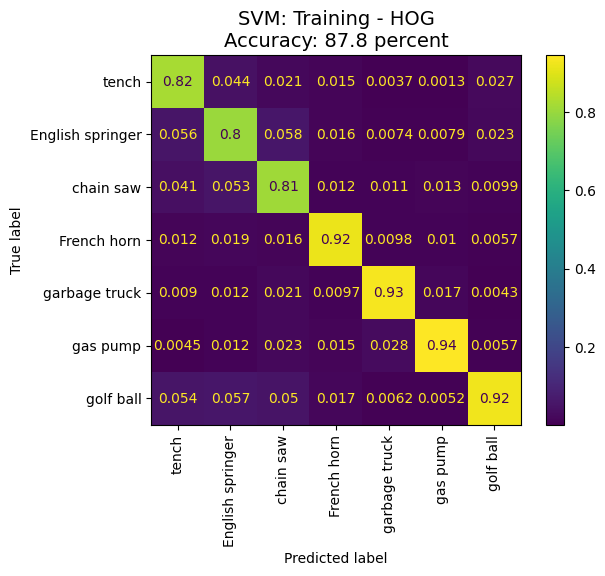

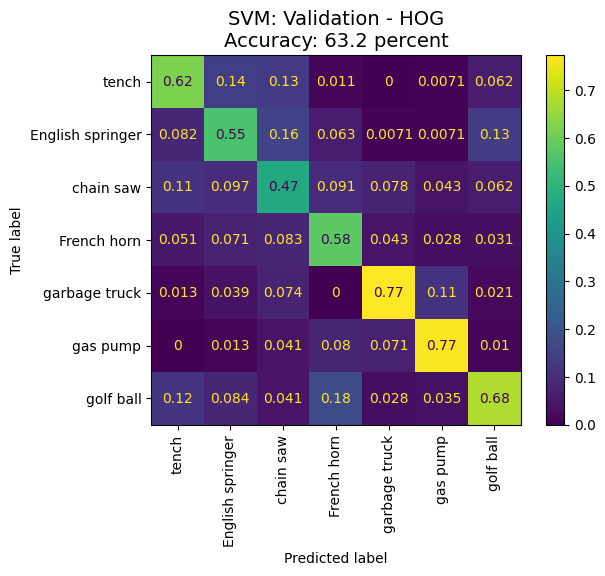

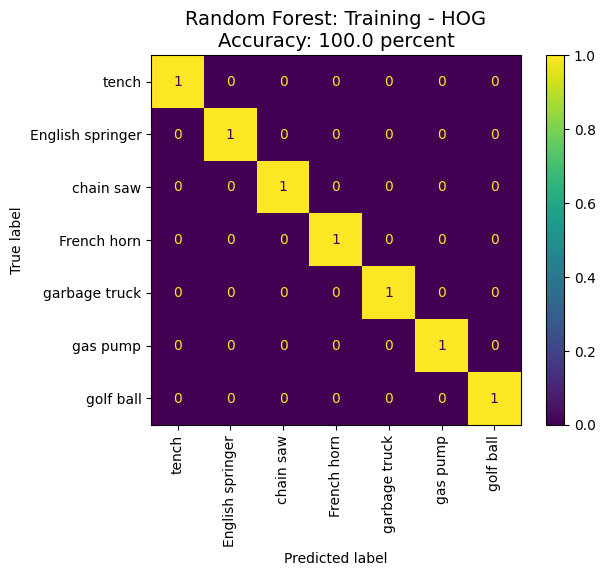

...

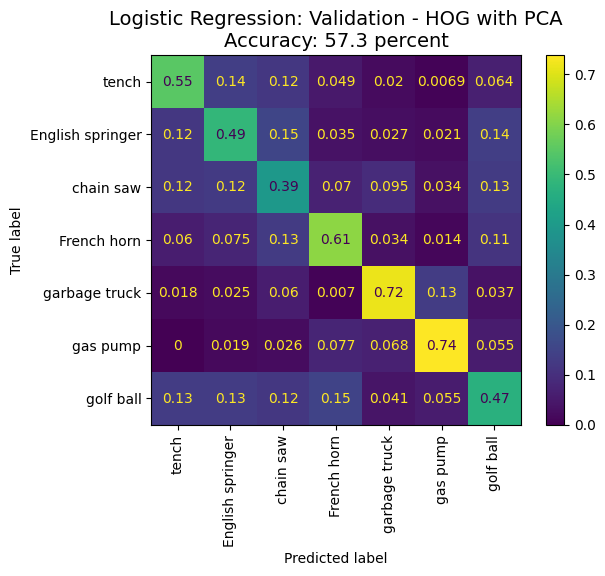

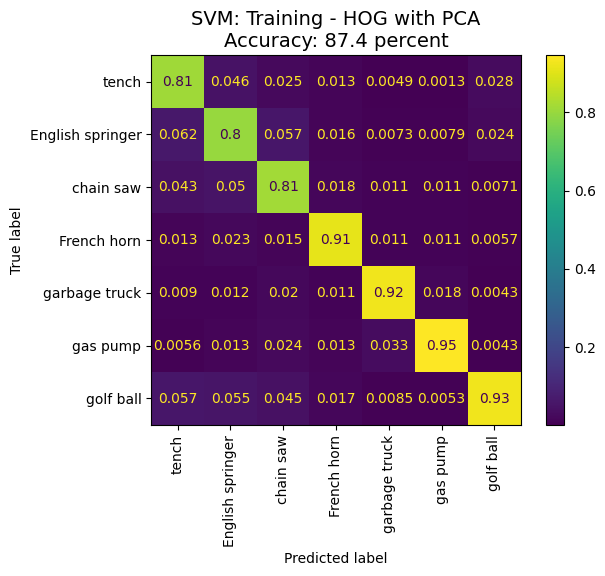

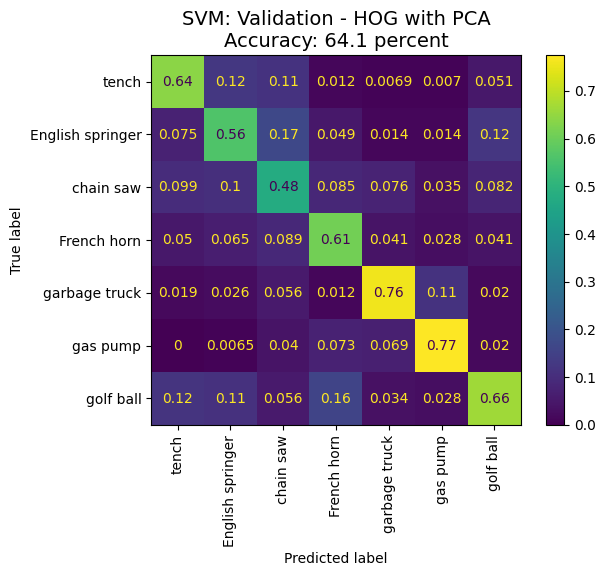

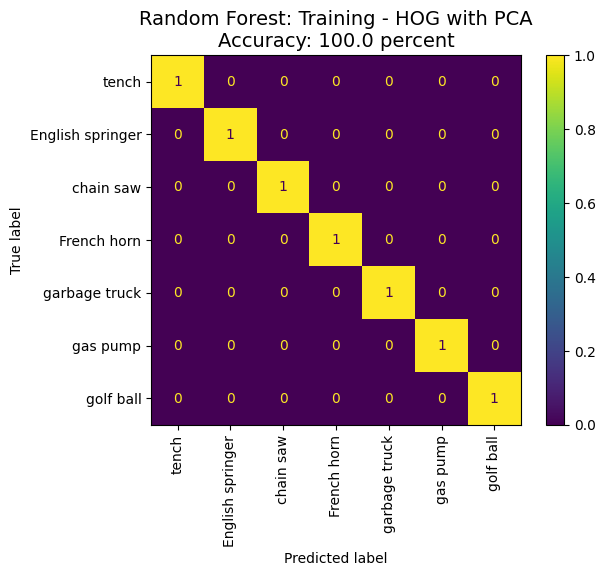

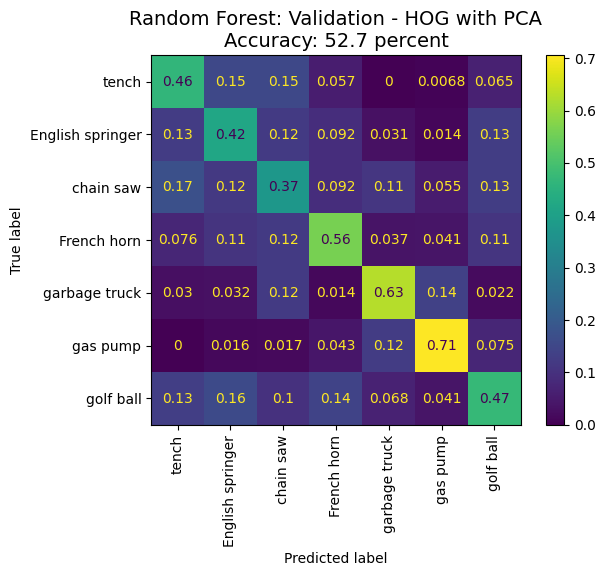

In [14]:
# Define the feature sets we will use
feature_desc = {'HOG': {'train': (train_hog, train['label']),
                       'val': (val_hog, val['label']),
                       },
                'HOG with PCA': {'train': (train_hog_pca, train['label']),
                                 'val': (val_hog_pca, val['label']),
                                 }

              }


model_results = {feature: {model: {} for model in model_dict.keys()} for feature in feature_desc.keys()}


model_results = run_model(feature_desc, model_dict, label_dict, model_results, plot_cm = True, best_params = False)

# GLCM Feature Extraction

GLCM uses spatial pixel intensity relationships between neighboring pixels to characterize texture within an image. Since the objects we wanted to classify had varying textures such as the fluffiness of the English springer dog and the smoothness of the French horn, we thought GLCM could provide useful feature information. GLCM calculates the co-occurrence of pixel intensities with consideration of proximity to each other. We will explore GLCM and its parameters to charter a course for additional simple feature extraction methodologies. We will also apply PCA on the features for decreased dimensionality.


The t-SNE plot shows more defined shapes occurring which could hint that too much information is being removed. We need 3 principle components to capture 90% of the explained variance


In [15]:
def GLCM(dataset):
  '''
  Outputs the extracted features using GLCM
  '''
  g_dset= copy.deepcopy(dataset)
  g_dset.set_format(type='numpy', columns=['image', 'label'], dtype=np.uint8)

  out_glcm = pd.DataFrame()
  for img in g_dset['image']:
      df = pd.DataFrame() # temporary data frame to capture info for each image, will be reset to blank after each loop
      glcm = graycomatrix(img, distances=[12], angles=[0])
      df['Energy'] = graycoprops(glcm, 'energy')[0]
      df['Corr '] = graycoprops(glcm, 'correlation')[0]
      df['Diss'] = graycoprops(glcm, 'dissimilarity')[0]
      df['Homogen'] = graycoprops(glcm, 'homogeneity')[0]
      df['Contrast'] = graycoprops(glcm, 'contrast')[0]

      out_glcm = pd.concat([out_glcm, df])

  return out_glcm

# fit standard scale
train_glcm_unscaled = GLCM(train)
scaler = StandardScaler()
scaler.fit(train_glcm_unscaled)

# apply standard scale
train_glcm = scaler.transform(train_glcm_unscaled)
val_glcm = scaler.transform(GLCM(val))
test_glcm = scaler.transform(GLCM(test))

Total Explained Variance: 5.0009
Total Explained Variance Ratio: 1.0000
Original Number of Components: (5588, 5)
Number of principal components for 90% explained variance: 3


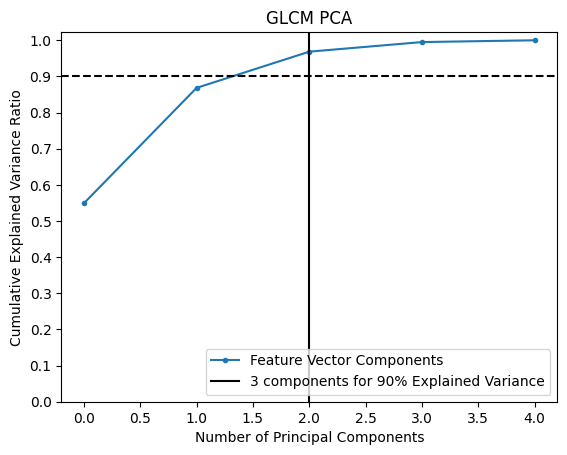

In [16]:
pca, minimum_components_90 = pca_explained_variance(train_glcm, title='GLCM', n_components=None, plot=True, details=True)
to_transform = [train_glcm, val_glcm, test_glcm]
train_glcm_pca, val_glcm_pca, test_glcm_pca = [pca.transform(dataset_features)[:, :minimum_components_90] for dataset_features in to_transform]

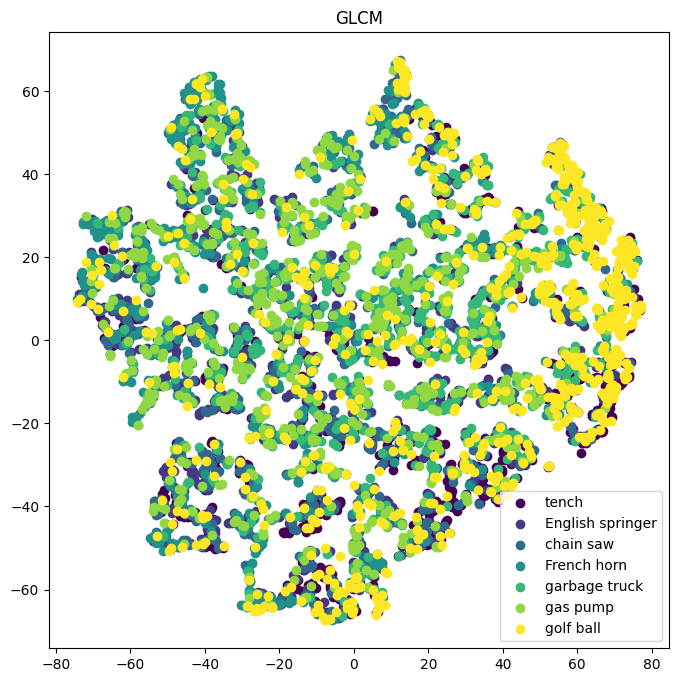

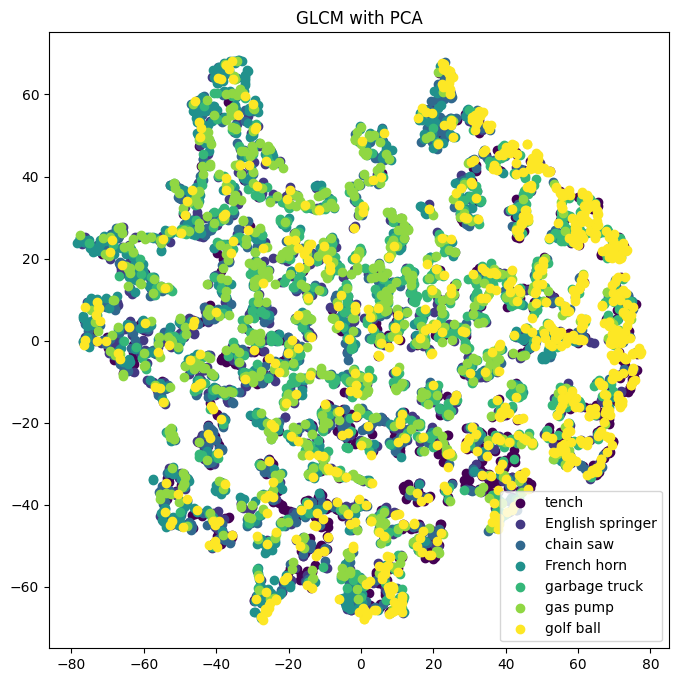

In [15]:
features = [train_glcm, train_glcm_pca]
title = ['GLCM', 'GLCM with PCA']
targets = train['label']

for i, feature in enumerate(features):
    tsne_plot(feature, targets, label_dict, title[i])

We see that the differences between training and validation for the classifiers Logistic Regression and SVM are negligable (training is just a few percentage points higher than validation) for GLCM feature extraction for both full dimensionality and reduced dimensionality, where some validation accuracies are better than their training counterpart. We see the same overfitting pattern for Random Forest for both full and reduced dimensionality.

Logistic Regression training time: 0.11 seconds
The Logistic Regression Training - GLCM is 38.55% accurate
The Logistic Regression Validation - GLCM is 37.39% accurate
SVM training time: 1.58 seconds
The SVM Training - GLCM is 41.36% accurate
The SVM Validation - GLCM is 37.49% accurate
Random Forest training time: 1.71 seconds
The Random Forest Training - GLCM is 100.0% accurate
The Random Forest Validation - GLCM is 36.37% accurate
Logistic Regression training time: 0.04 seconds
The Logistic Regression Training - GLCM with PCA is 31.28% accurate
The Logistic Regression Validation - GLCM with PCA is 29.69% accurate
SVM training time: 1.67 seconds
The SVM Training - GLCM with PCA is 35.84% accurate
The SVM Validation - GLCM with PCA is 31.81% accurate
Random Forest training time: 1.09 seconds
The Random Forest Training - GLCM with PCA is 100.0% accurate
The Random Forest Validation - GLCM with PCA is 28.88% accurate


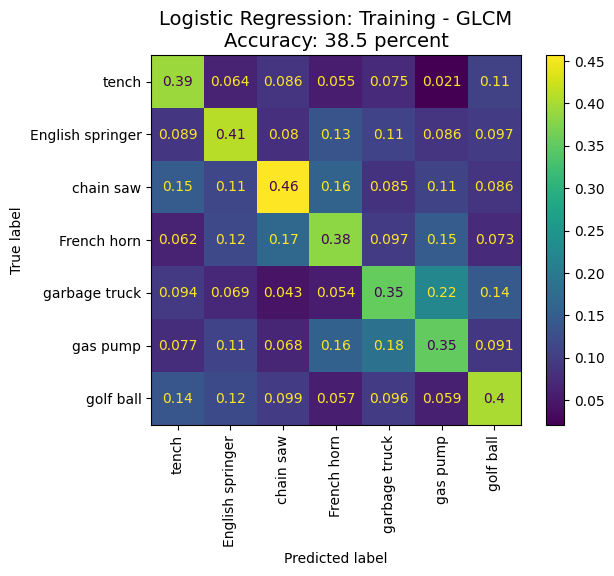

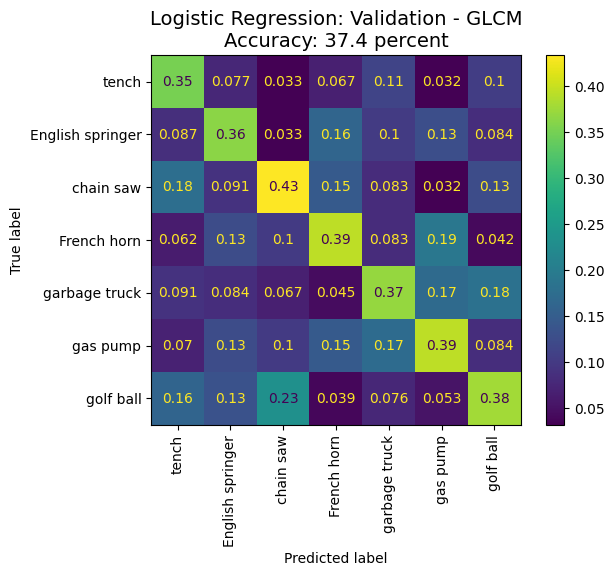

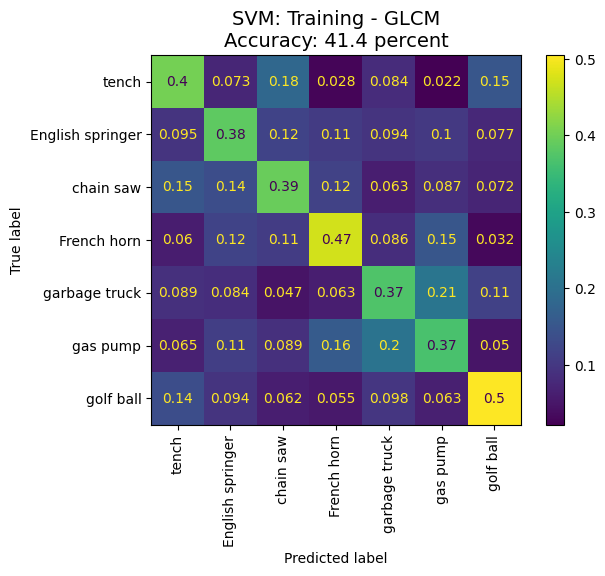

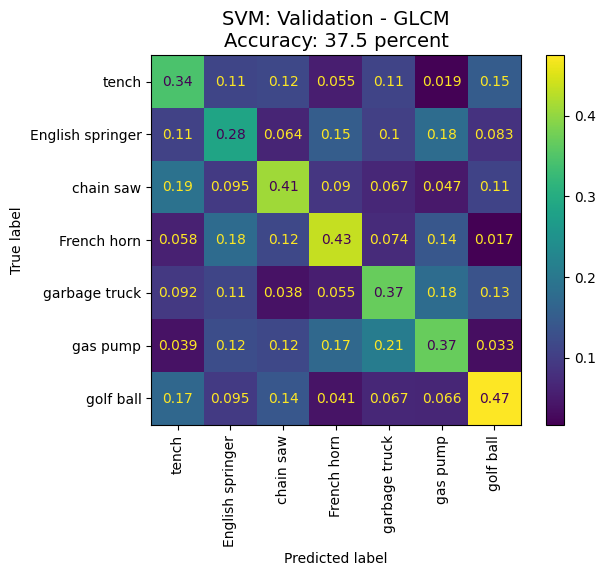

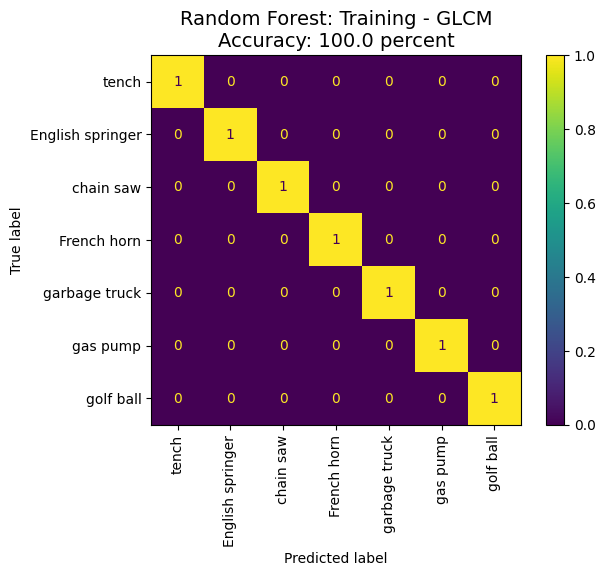

...

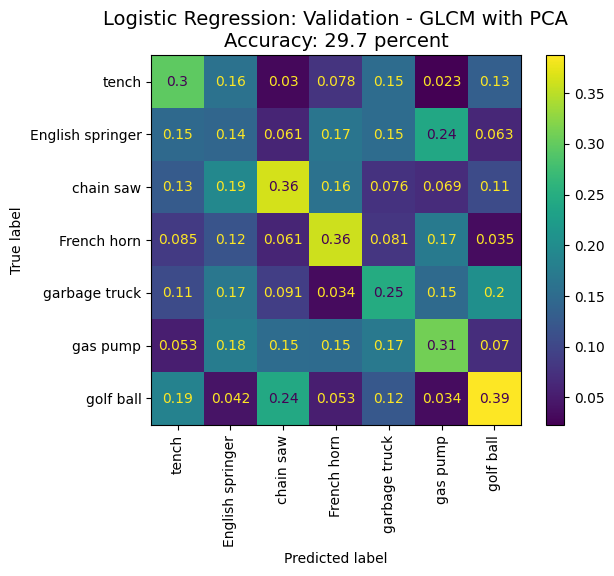

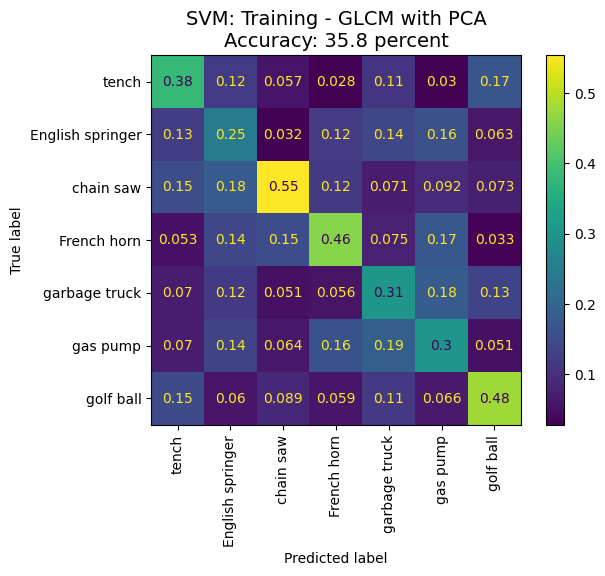

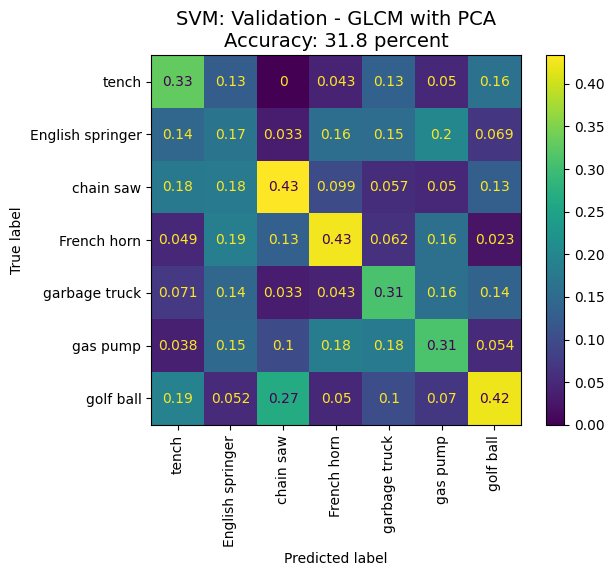

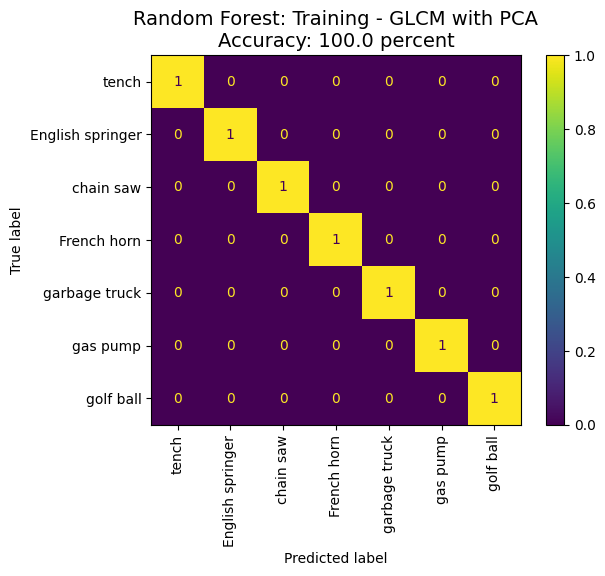

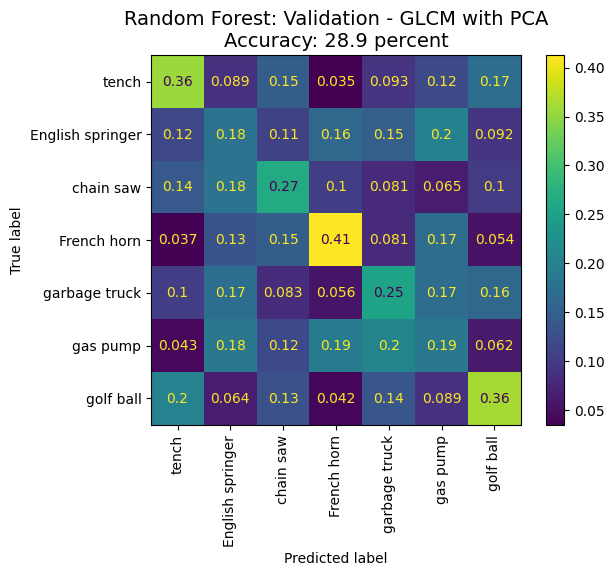

In [17]:
# Define features we will use for the model.
feature_desc = {'GLCM': {'train': (train_glcm, train['label']),
                         'val': (val_glcm, val['label']),
                         },
                'GLCM with PCA': {'train': (train_glcm_pca, train['label']),
                                  'val': (val_glcm_pca, val['label']),
                                  },

              }


model_results_temp = {feature: {model: {} for model in model_dict.keys()} for feature in feature_desc.keys()}
model_results.update(model_results_temp)


model_results = run_model(feature_desc, model_dict, label_dict, model_results, plot_cm = True, best_params = False)

We wanted to harness the power of each of the individual feature extraction methods, hoping that combining them would yield an improved feature set, and in turn, better classifications.


We horizontally stacked the features from HOG and GLCM for a Simple Combined Feature set and then applied a StandardScalar. We were investigating just the two features as part of the Simple Combine Feature set to explore how far we can leverage these simple, easily explainable features for classification.

# Combined Simple Feature Sets

Total Explained Variance: 12.5800
Total Explained Variance Ratio: 1.0000
Original Number of Components: (5588, 1805)
Number of principal components for 90% explained variance: 124


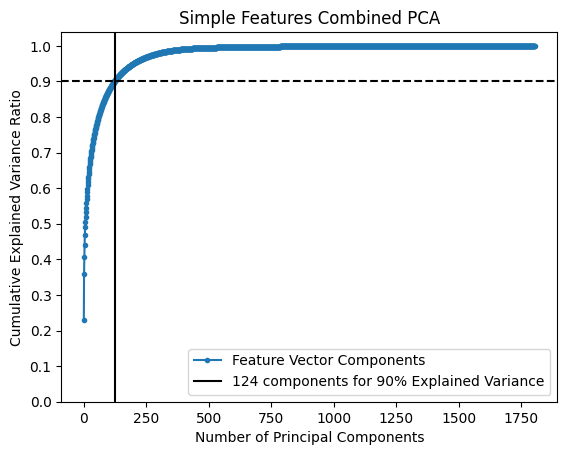

In [18]:
# combine all features together by dataset
train_comb = np.hstack((np.array(train_hog), train_glcm))
val_comb = np.hstack((np.array(val_hog), val_glcm))
test_comb = np.hstack((np.array(test_hog), test_glcm))
to_transform = [train_comb, val_comb, test_comb]

# Scale on training features
scaler = StandardScaler()
scaler.fit(train_comb)
train_comb_simple, val_comb_simple, test_comb_simple = [scaler.transform(dataset_features) for dataset_features in to_transform]


# PCA to training features
to_transform = [train_comb_simple, val_comb_simple, test_comb_simple]
pca, minimum_components_90 = pca_explained_variance(train_comb, title='Simple Features Combined', n_components=None, plot=True, details=True)

# apply PCA to all feature datasets
train_comb_simple_pca, val_comb_simple_pca, test_comb_simple_pca = [pca.transform(dataset_features)[:, :minimum_components_90] for dataset_features in to_transform]

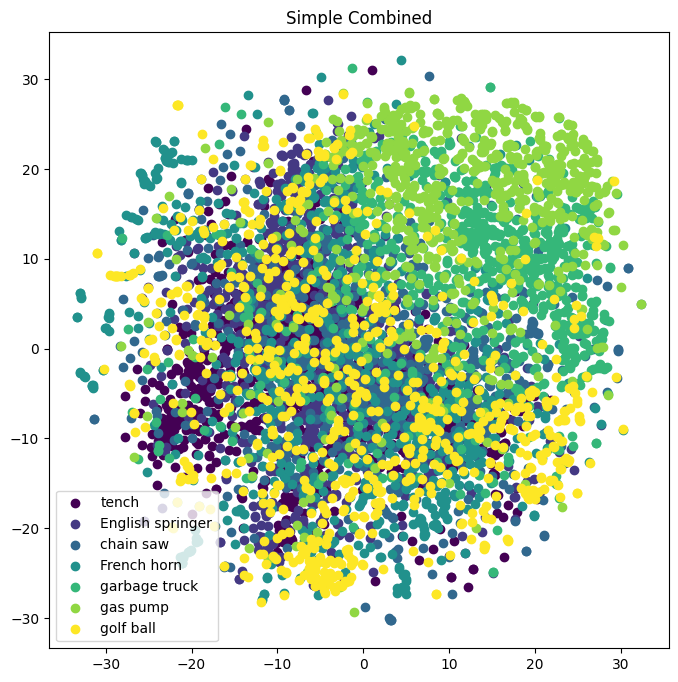

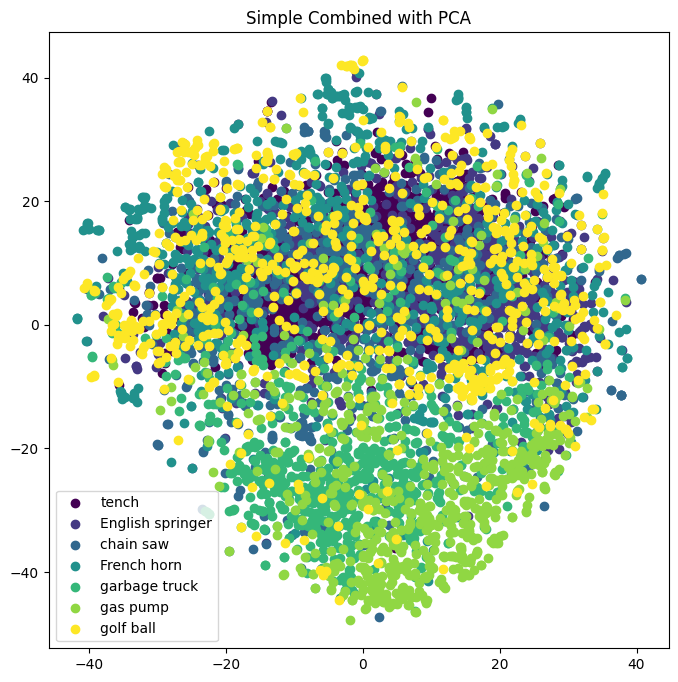

In [18]:
features = [train_comb_simple, train_comb_simple_pca]
title = ['Simple Combined', 'Simple Combined with PCA']
targets = train['label']

for i, feature in enumerate(features):
    tsne_plot(feature, targets, label_dict, title[i])

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Logistic Regression training time: 0.57 seconds
The Logistic Regression Training - Simple Combined Features with PCA is 65.98% accurate
The Logistic Regression Validation - Simple Combined Features with PCA is 62.51% accurate
SVM training time: 5.21 seconds
The SVM Training - Simple Combined Features with PCA is 87.04% accurate
The SVM Validation - Simple Combined Features with PCA is 65.05% accurate
Random Forest training time: 7.98 seconds
The Random Forest Training - Simple Combined Features with PCA is 100.0% accurate
The Random Forest Validation - Simple Combined Features with PCA is 55.02% accurate


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Logistic Regression training time: 10.58 seconds
The Logistic Regression Training - Simple Combined Features is 92.32% accurate
The Logistic Regression Validation - Simple Combined Features is 53.8% accurate
SVM training time: 50.72 seconds
The SVM Training - Simple Combined Features is 89.92% accurate
The SVM Validation - Simple Combined Features is 65.55% accurate
Random Forest training time: 28.14 seconds
The Random Forest Training - Simple Combined Features is 100.0% accurate
The Random Forest Validation - Simple Combined Features is 56.33% accurate


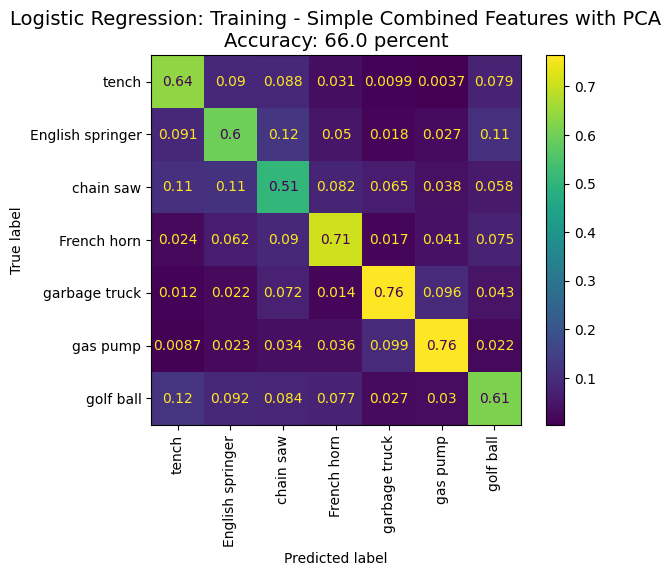

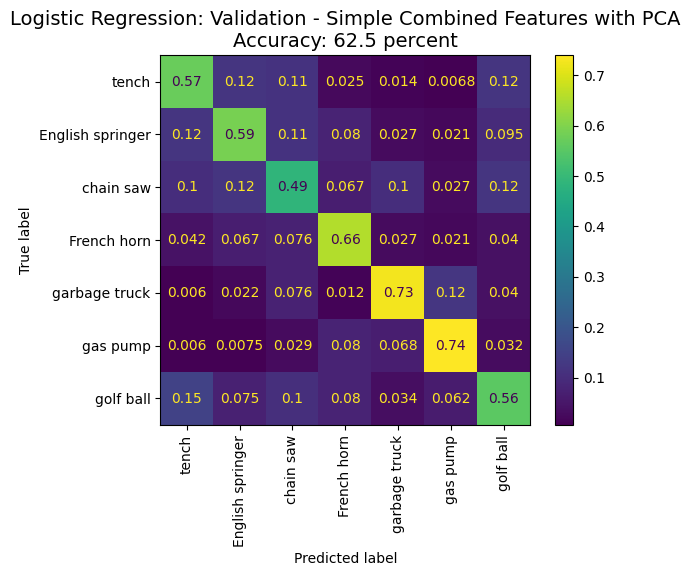

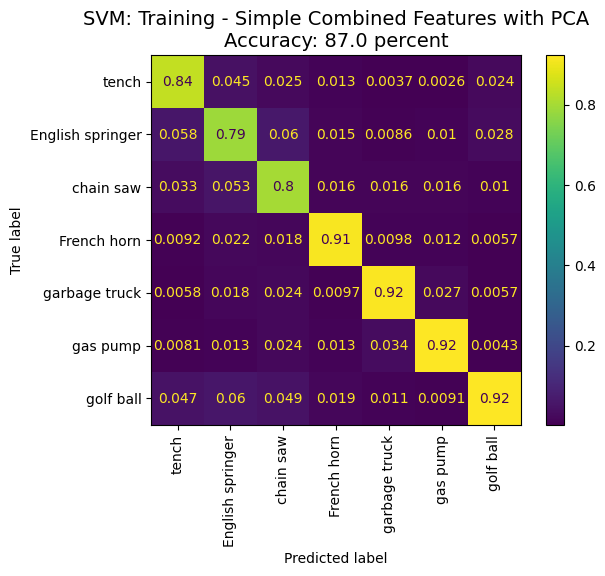

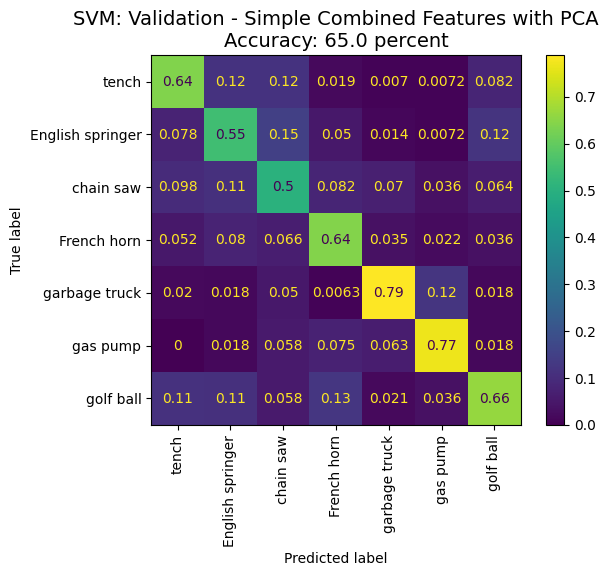

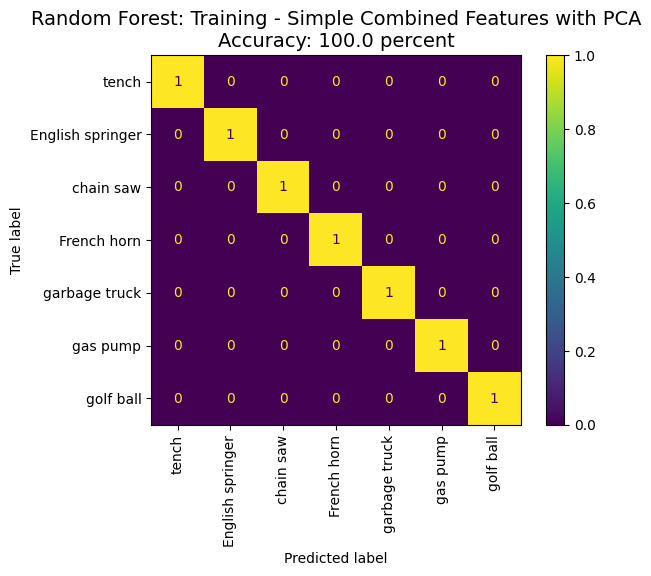

...

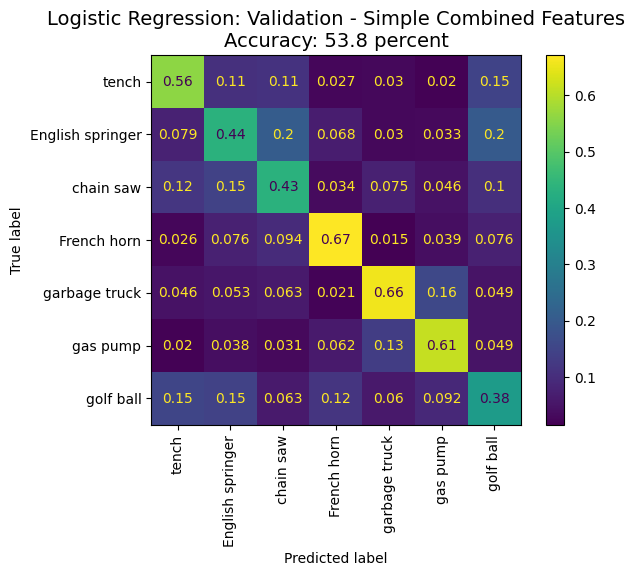

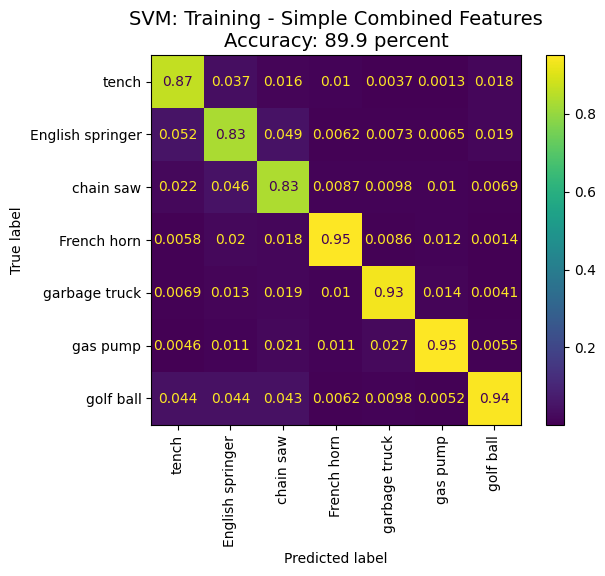

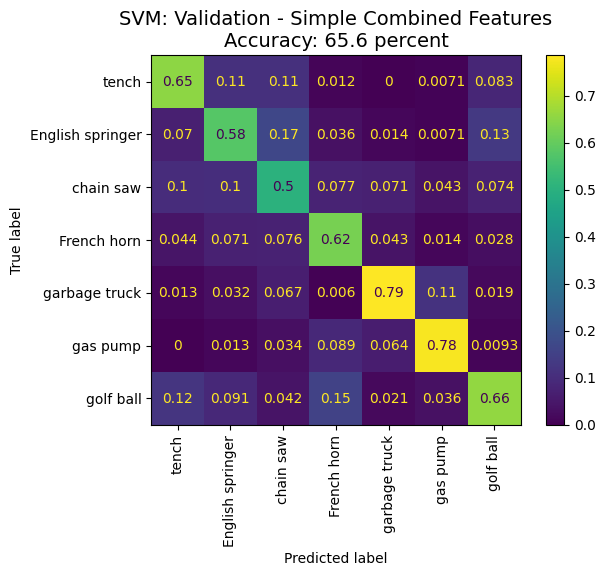

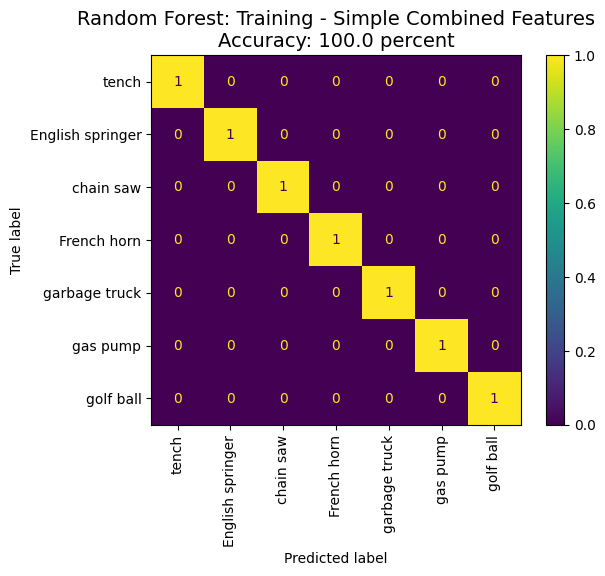

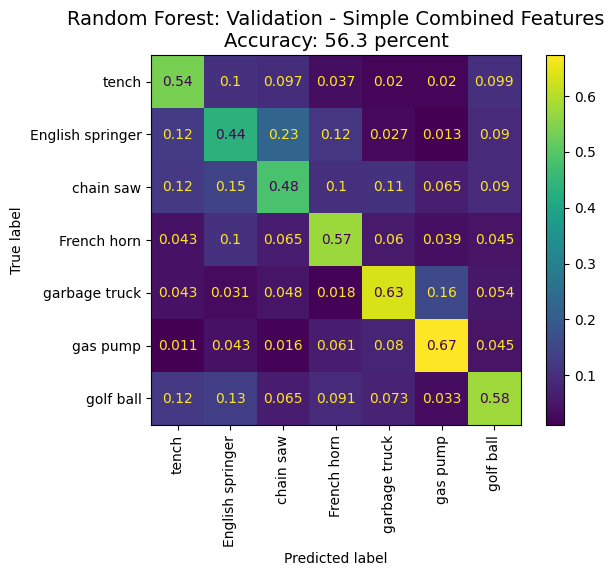

In [19]:
# Define features to input into model
feature_desc = {'Simple Combined Features with PCA': {'train': (train_comb_simple_pca, train['label']),
                                                'val': (val_comb_simple_pca, val['label']),
                                               },
                'Simple Combined Features': {'train': (train_comb_simple, train['label']),
                                      'val': (val_comb_simple, val['label']),
                                      },

              }




model_results_temp = {feature: {model: {} for model in model_dict.keys()} for feature in feature_desc.keys()}
model_results.update(model_results_temp)


model_results = run_model(feature_desc, model_dict, label_dict, model_results, plot_cm = True, best_params = False)

Below is a summary table of the train and validation results from the three models above.

In [20]:
# initialize dataframe
iterables = [list(model_results['HOG'].keys()), list(model_results.keys())]
index = pd.MultiIndex.from_product(iterables, names=['Classifier', 'Features'])
display_df = pd.DataFrame(index=index)

# populate from model_results dictionary
for feature, models in model_results.items():
    for model, run in models.items():
        display_df.loc[(model,feature), 'Train Accuracy'] = round(accuracy_score(train['label'], run['preds']['model_train'][0])*100,1)
        display_df.loc[(model,feature), 'Val Accuracy'] = round(accuracy_score(val['label'], run['preds']['model_predict'][0])*100,1)
        display_df.loc[(model,feature), 'Training Time'] = round(run['training_time'],2)


display_prelim_df = copy.deepcopy(display_df)
display_prelim_df

Train Accuracy  \
Classifier          Features                                            
Logistic Regression HOG                                          68.4   
                    HOG with PCA                                 63.0   
                    GLCM                                         38.3   
                    GLCM with PCA                                30.8   
                    Simple Combined Features with PCA            66.7   
                    Simple Combined Features                     91.7   
SVM                 HOG                                          87.8   
                    HOG with PCA                                 87.4   
                    GLCM                                         41.5   
                    GLCM with PCA                                35.7   
                    Simple Combined Features with PCA            87.1   
                    Simple Combined Features                     89.6   
Random Forest       HOG                                         100.0   
                    HOG with PCA                                100.0   
                    GLCM                                        100.0   
                    GLCM with PCA                               100.0   
                    Simple Combined Features with PCA           100.0   
                    Simple Combined Features                    100.0   

                                                       Val Accuracy  \
Classifier          Features                                          
Logistic Regression HOG                                        55.8   
                    HOG with PCA                               55.5   
                    GLCM                                       37.6   
                    GLCM with PCA                              31.0   
                    Simple Combined Features with PCA          58.6   
                    Simple Combined Features                   50.9   
SVM                 HOG                                        58.5   
                    HOG with PCA                               59.1   
                    GLCM                                       39.6   
                    GLCM with PCA                              35.4   
                    Simple Combined Features with PCA          60.7   
                    Simple Combined Features                   61.0   
Random Forest       HOG                                        52.1   
                    HOG with PCA                               51.7   
                    GLCM                                       37.4   
                    GLCM with PCA                              29.5   
                    Simple Combined Features with PCA          53.3   
                    Simple Combined Features                   55.4   

                                                       Training Time  
Classifier          Features                                          
Logistic Regression HOG                                        11.79  
                    HOG with PCA                                0.59  
                    GLCM                                        0.17  
                    GLCM with PCA                               0.03  
                    Simple Combined Features with PCA           0.60  
                    Simple Combined Features                    9.82  
SVM                 HOG                                        49.70  
                    HOG with PCA                                5.08  
                    GLCM                                        2.03  
                    GLCM with PCA                               1.51  
                    Simple Combined Features with PCA           4.63  
                    Simple Combined Features                   51.43  
Random Forest       HOG                                        30.13  
                    HOG with PCA                                9.86  
                    GLCM             

We are not obtaining great accuracies that elude to powerful, predictive models. We might benefit from trying to optimize parameters, rather than just using the default parameters.



We can perform a gridsearch which loops through the parameters, and extract the parameters that offer the best results. We won't consider Random Forest in this search, as it previously exclusively provided poor predictions because it overfit our data. We are perfoming this gridsearch with a stratified cross validation technique (5 folds) to ensure the distribution of classes within each fold was representative of the training dataset.

# Cross Validation Run

Logistic Regression training time: 1.22 seconds
The Logistic Regression Training - Simple Combined Features with PCA is 65.93% accurate
The Logistic Regression Validation - Simple Combined Features with PCA is 62.41% accurate


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


SVM training time: 5.10 seconds
The SVM Training - Simple Combined Features with PCA is 100.0% accurate
The SVM Validation - Simple Combined Features with PCA is 64.74% accurate
Random Forest training time: 7.33 seconds
The Random Forest Training - Simple Combined Features with PCA is 100.0% accurate
The Random Forest Validation - Simple Combined Features with PCA is 54.2% accurate


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Logistic Regression training time: 109.96 seconds
The Logistic Regression Training - Simple Combined Features is 100.0% accurate
The Logistic Regression Validation - Simple Combined Features is 49.75% accurate


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


SVM training time: 66.88 seconds
The SVM Training - Simple Combined Features is 100.0% accurate
The SVM Validation - Simple Combined Features is 65.55% accurate
Random Forest training time: 25.96 seconds
The Random Forest Training - Simple Combined Features is 100.0% accurate
The Random Forest Validation - Simple Combined Features is 56.43% accurate


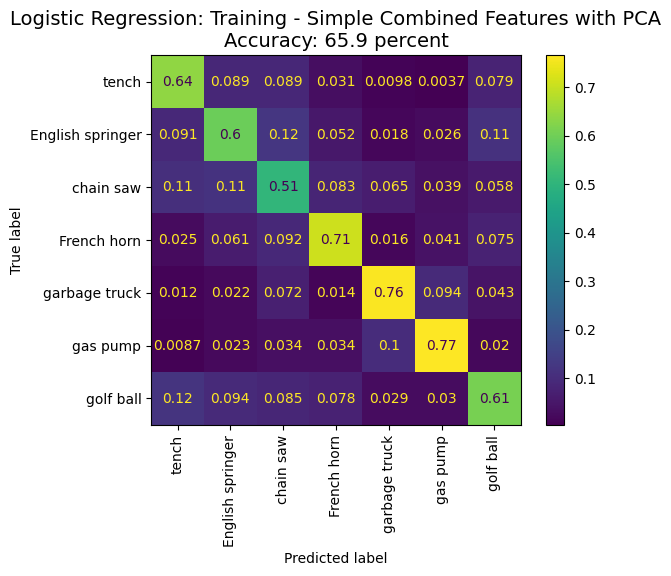

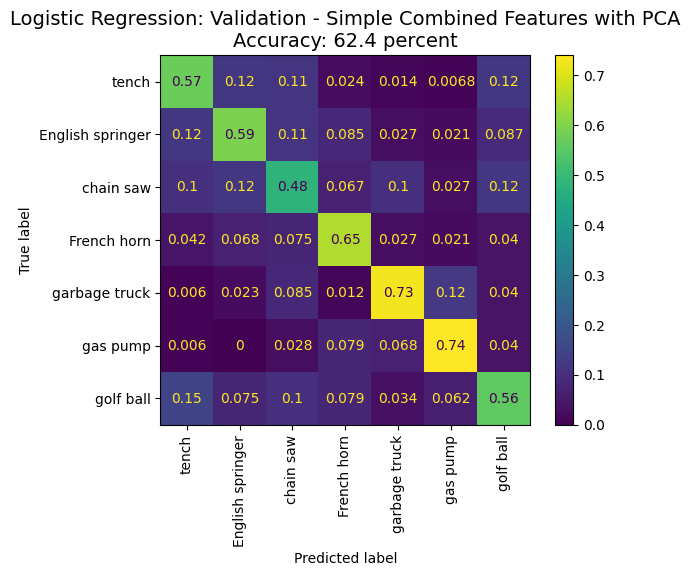

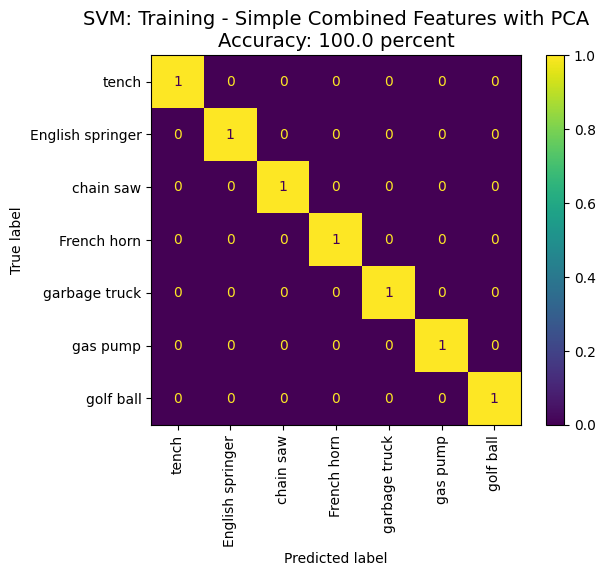

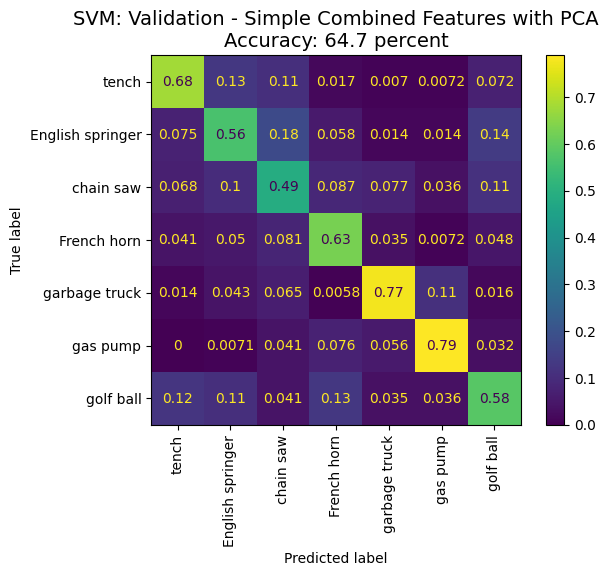

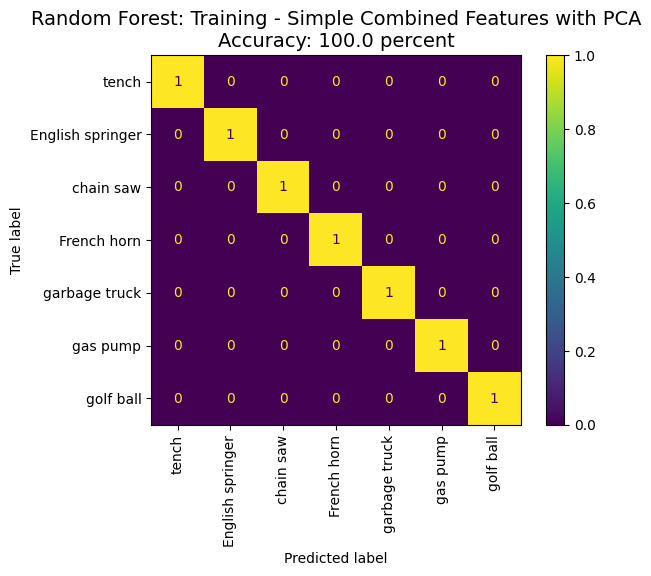

...

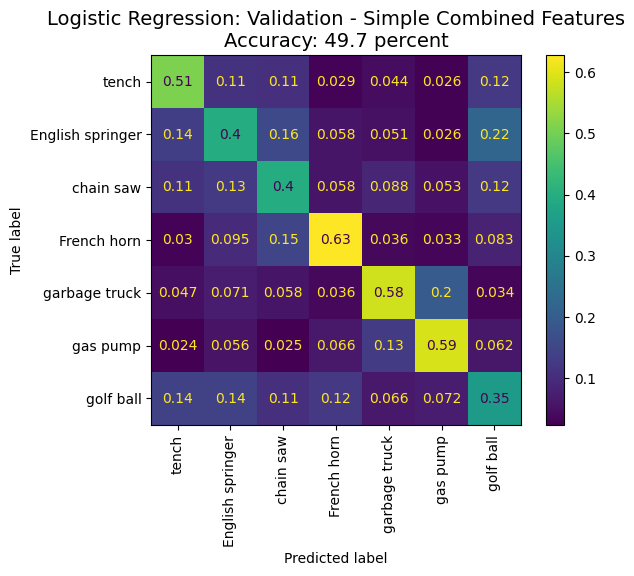

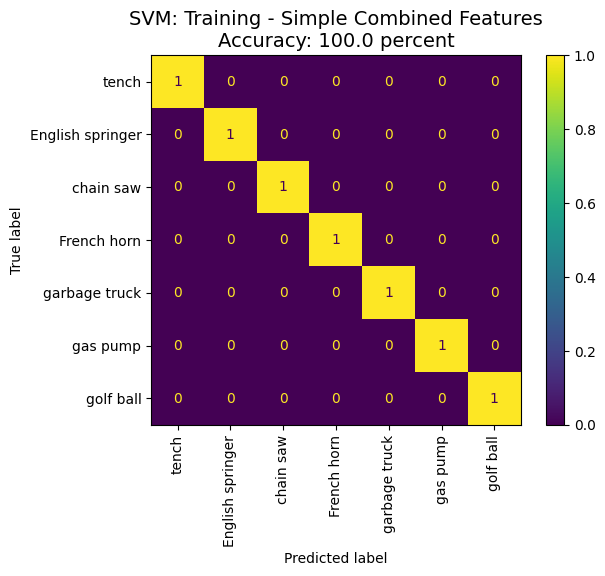

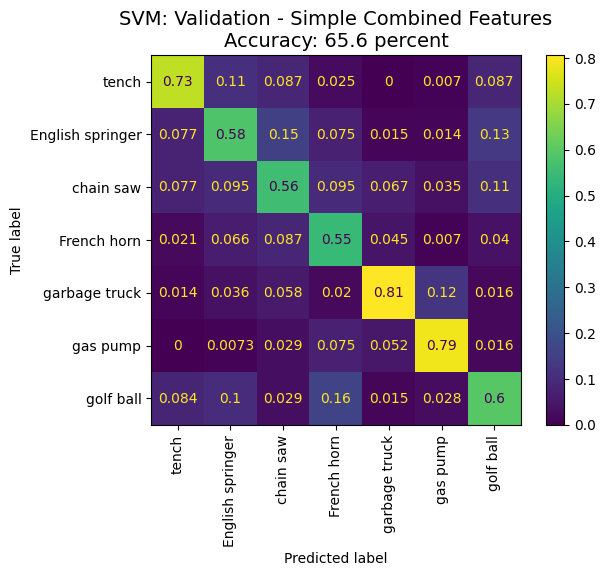

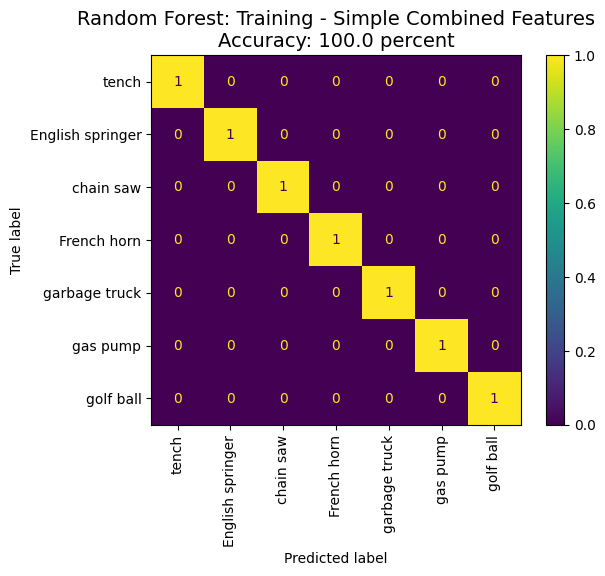

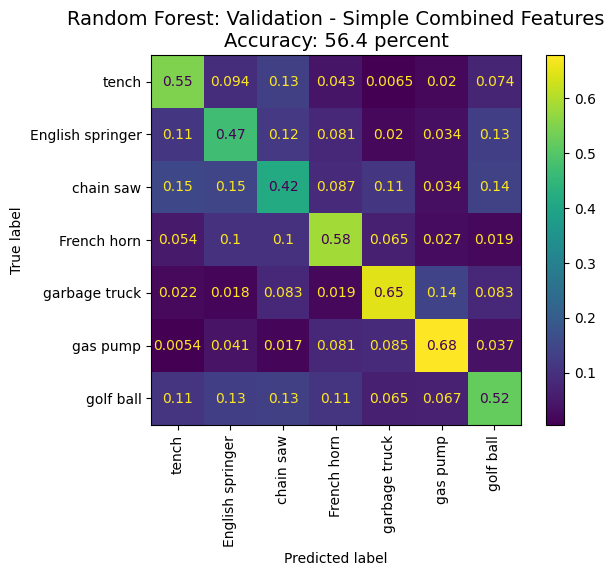

In [20]:
run_cross_validaton = False
if run_cross_validaton:
  feature_desc = {'HOG with PCA': {'train': (train_hog_pca, train['label']),
                                      'val': (val_hog_pca, val['label']),
                                      },
                  'HOG': {'train': (train_hog, train['label']),
                            'val': (val_hog, val['label']),
                            },
                  'Simple Combined Features with PCA': {'train': (train_comb_simple_pca, train['label']),
                                                  'val': (val_comb_simple_pca, val['label']),
                                                },
                  'Simple Combined Features': {'train': (train_comb_simple, train['label']),
                                        'val': (val_comb_simple, val['label']),
                                        },
                  'GLCM with PCA': {'train': (train_glcm_pca, train['label']),
                                    'val': (val_glcm_pca, val['label']),
                                    },
                  'GLCM': {'train': (train_glcm, train['label']),
                          'val': (val_glcm, val['label']),
                          },

                }

  model_dict = {
              'Logistic Regression':   {'estimator': LogisticRegression(),
                                        'param_grid': {'solver': ['lbfgs'], # if continues to crash try changing to liblinear
                                                      'C': [0.1, 1, 10, 100],
                                                      'penalty': ['l2'],
                                                      'max_iter': [1000]
                                                      }
                                        },
                'SVM':           {'estimator': SVC(),
                                  'param_grid': {'C': [0.1, 1, 10],
                                                  'gamma': [0.001, 0.01, .1, 1],
                                                  'kernel': ['rbf', 'poly', 'linear'],
                                                'max_iter': [1000]
                                                },
                                  },
                }


  model_results_temp = {feature: {model: {} for model in model_dict.keys()} for feature in feature_desc.keys()}
  model_results.update(model_results_temp)

  model_results = run_model(feature_desc, model_dict, label_dict, model_results, plot_cm = True, best_params = True, load_params = False)

  file_name = 'validation_results_cv5.pickle'

  with open(file_name, 'wb') as handle:
      pickle.dump(model_results, handle, protocol=pickle.HIGHEST_PROTOCOL)

else:
  with open('validation_results_cv5.pkl', 'rb') as handle:
      model_results = pickle.load(handle)
  model_results = run_model(feature_desc, model_dict, label_dict, model_results, plot_cm = True, best_params = False, load_params = True)


Below is the output, the optimized parameters, from the Grid Search for each model.

In [22]:
# display best parameters for each run
for feature, models in model_results.items():
    print('_'*90)
    for model, run in models.items():
      if model == "Random Forest":
        pass
      else:
        print(model, run['best_params'])

__________________________________________________________________________________________
Logistic Regression {'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
SVM {'C': 10, 'gamma': 0.1, 'kernel': 'rbf', 'max_iter': 1000}
__________________________________________________________________________________________
Logistic Regression {'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
SVM {'C': 10, 'gamma': 0.1, 'kernel': 'rbf', 'max_iter': 1000}
__________________________________________________________________________________________
Logistic Regression {'C': 100, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
SVM {'C': 10, 'gamma': 0.1, 'kernel': 'rbf', 'max_iter': 1000}
__________________________________________________________________________________________
Logistic Regression {'C': 1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
SVM {'C': 10, 'gamma': 0.1, 'kernel': 'rbf', 'max_iter': 1000}
______________________________________________

In [23]:
# initialize dataframe
iterables = [[key for key in model_results['GLCM'].keys() if 'SVM' in key or 'Logistic Regression' in key], list(model_results.keys())]
index = pd.MultiIndex.from_product(iterables, names=['Classifier', 'Features'])
display_df = pd.DataFrame(index=index)

# populate from model_results dictionary
for feature, models in model_results.items():
    for model, run in models.items():

      if model == "Random Forest":
        pass
      else:
        display_df.loc[(model,feature), 'Train Accuracy'] = round(accuracy_score(train['label'], run['preds']['model_train'][0])*100,1)
        display_df.loc[(model,feature), 'Val Accuracy'] = round(accuracy_score(val['label'], run['preds']['model_predict'][0])*100,1)
        display_df.loc[(model,feature), 'Training Time'] = round(run['training_time'],2)
        display_df.loc[(model,feature), 'Inference Time'] = round(run['inference_time'],3)

display_cv5_df = copy.deepcopy(display_df)
display_cv5_df

Train Accuracy  \
Classifier          Features                                            
Logistic Regression HOG                                          68.4   
                    HOG with PCA                                 63.0   
                    GLCM                                         38.3   
                    GLCM with PCA                                30.8   
                    Simple Combined Features with PCA            66.7   
                    Simple Combined Features                    100.0   
SVM                 HOG                                          87.8   
                    HOG with PCA                                 87.4   
                    GLCM                                         41.5   
                    GLCM with PCA                                35.7   
                    Simple Combined Features with PCA           100.0   
                    Simple Combined Features                    100.0   

                                                       Val Accuracy  \
Classifier          Features                                          
Logistic Regression HOG                                        55.8   
                    HOG with PCA                               55.5   
                    GLCM                                       37.6   
                    GLCM with PCA                              31.0   
                    Simple Combined Features with PCA          58.5   
                    Simple Combined Features                   48.7   
SVM                 HOG                                        58.5   
                    HOG with PCA                               59.1   
                    GLCM                                       39.6   
                    GLCM with PCA                              35.4   
                    Simple Combined Features with PCA          62.2   
                    Simple Combined Features                   61.2   

                                                       Training Time  \
Classifier          Features                                           
Logistic Regression HOG                                        11.79   
                    HOG with PCA                                0.59   
                    GLCM                                        0.17   
                    GLCM with PCA                               0.03   
                    Simple Combined Features with PCA           1.30   
                    Simple Combined Features                  106.06   
SVM                 HOG                                        49.70   
                    HOG with PCA                                5.08   
                    GLCM                                        2.03   
                    GLCM with PCA                               1.51   
                    Simple Combined Features with PCA           5.89   
                    Simple Combined Features                   61.41   

                                                       Inference Time  
Classifier          Features                                           
Logistic Regression HOG                                         0.011  
                    HOG with PCA                                0.002  
                    GLCM                                        0.000  
                    GLCM with PCA                               0.000  
                    Simple Combined Features with PCA           0.001  
                    Simple Combined Features                    0.008  
SVM                 HOG                                        12.000  
                    HOG with PCA                                1.402  
                    GLCM                                        0.297  
                    GLCM with PCA                               0.295  
                    Simple Combined Features with PCA           0.738  
                    Simple Combined Features                   15.997

We obtained extremely similar training and validation accuracies when using the parameters extracted from the gridsearch. This could be due to the extracted featrues are simple, and not robust enough for this advanced image classification.


Confusion matrices of HOG, GLCM and their combination with Simple Combined Features show similarities that the highest rate of misclassification for Chainsaw was an English Springer or a Tench. HOG and the Simple Combined Features share similar patterns where French Horn has the highest true positive rate and Chainsaw has the lowest. This trend is consistent across classifiers and therefore the limitations are likely due to the simple features' low-level ability to associate pixel relationships.


# RESNET

The previous feature extraction methods exemplify ways we can extract features from images for classification. Despite altering parameters in hopes of improved performance, HOG and GLCM might not be robust enough for our image classification problems, and we were testing those limitations at the border, even when the features were combined.

A Residual Neural Network, ResNet, is a deep learning model which introduces skip connections to mitigate the vanishing gradient problem, where negligibly small gradients are unable to provide meaningful impact during training


We used the pretrained ResNet101 model with our images, We pre-processed the images according to the ResNet101 recommendations of making them square, consistent in lengths of their sides, center cropped to a given pixel size and normalized the three color channels with a given mean and standard deviation. When plotting the resultant ResNet features with t-SNE, we observed very distinct groupings of each class as shown in Figure 15,  which is expected given the weights we used were trained on the larger set of ImageNet data.


Prior to applying PCA to reduce dimensions, ResNet was able to distinctly group the seven classes in the ResNet space with few misclassifications. After applying PCA, the separation performance remained the same as shown in Figure 16. We were able to explain 90% of the variance with 376 Principle Components, as seen in Figure 17.



In [8]:
# load the model
import torchvision.models as models

resnet101 = models.resnet101(weights='DEFAULT')

# get the network without the classification layer
# Drop the output layer (the ImageNet classifier)
def slice_model(original_model, from_layer=None, to_layer=None):
    return nn.Sequential(*list(original_model.children())[from_layer:to_layer])

model_conv_features = slice_model(resnet101, to_layer=-1).to('cpu')
summary(model_conv_features, input_size=(3, 224, 224))


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]           4,096
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]          16,384
      BatchNorm2d-12          [-1, 256, 56, 56]             512
           Conv2d-13          [-1, 256, 56, 56]          16,384
      BatchNorm2d-14          [-1, 256,

In [9]:
resnet101.eval()

def resnet_feature_extraction(in_imgs):
    def retype_image(in_img):
        if np.max(in_img) > 1:
            in_img = in_img.astype(np.uint8)
        else:
            in_img = (in_img * 255.0).astype(np.uint8)
        return in_img

    preprocess = transforms.Compose([
                    transforms.Resize(256),
                    transforms.CenterCrop(224),
                    transforms.ToTensor(),
                    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
                ])

    featurelist = []
    for i, img in enumerate(in_imgs):
        if i%100 ==0:
            print(f"{i} / {len(in_imgs)}")

        # preprocess the image to prepare it for input to CNN (must be PIL or Tensor)
        PIL_img = Image.fromarray(retype_image(img))
        out_im = preprocess(PIL_img)

        # append to feature list
        featurelist.append(model_conv_features(out_im.unsqueeze(0).to('cpu')).squeeze().detach().numpy())

    return np.vstack(featurelist)

## Load resnet embeddings of dataset from file
### Select based on operating system

In [ ]:
# # This takes forever, recommend loading from npy files if available
READ_RESNET = False
if READ_RESNET:

  val_resnet = np.load('val_resnet_mac.npy', allow_pickle=True)
  train_resnet = np.load('train_resnet_mac.npy', allow_pickle=True)
  test_resnet = np.load('test_resnet_mac.npy', allow_pickle=True)

else:
  train_resnet = resnet_feature_extraction(datasetDict['train']['image'])
  val_resnet = resnet_feature_extraction(datasetDict['validation']['image'])
  test_resnet = resnet_feature_extraction(datasetDict['test']['image'])
  with open('train_resnet_mac.npy', 'wb') as f:
      np.save(f, train_resnet)
  with open('val_resnet_mac.npy', 'wb') as f:
      np.save(f, val_resnet)
  with open('test_resnet_mac.npy', 'wb') as f:
      np.save(f, test_resnet)



Total Explained Variance: 113.6644
Total Explained Variance Ratio: 1.0000
Original Number of Components: (5588, 2048)
Number of principal components for 90% explained variance: 380


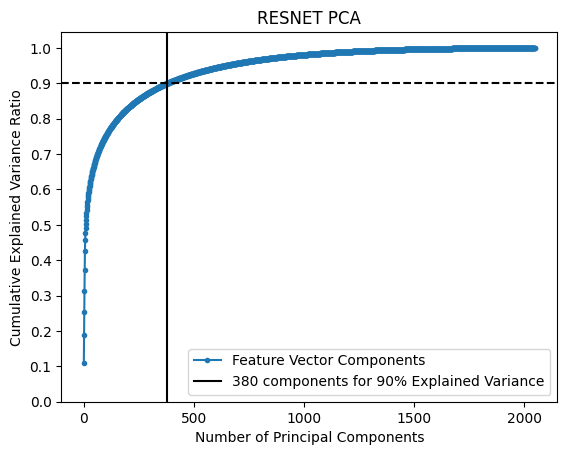

In [21]:
pca, minimum_components_90 = pca_explained_variance(train_resnet, title='RESNET', n_components=None, plot=True, details=True)
to_transform = [train_resnet, val_resnet, test_resnet]
train_resnet_pca, val_resnet_pca, test_resnet_pca = [pca.transform(dataset_features)[:, :minimum_components_90] for dataset_features in to_transform]

# TSNE

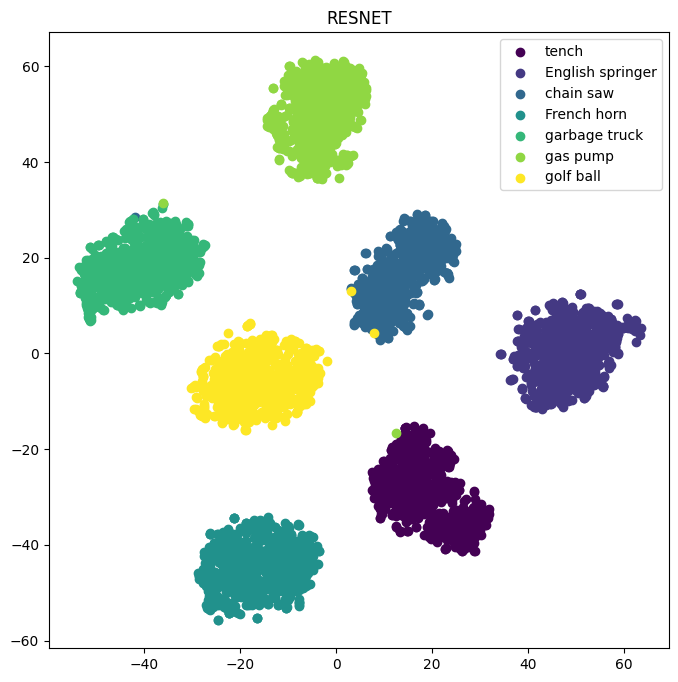

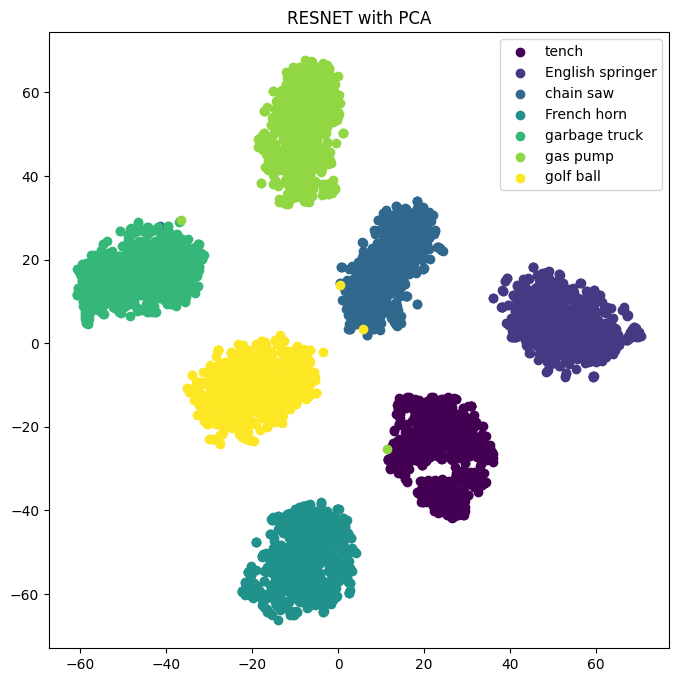

In [22]:
features = [ train_resnet, train_resnet_pca]
title = ['RESNET', 'RESNET with PCA']

targets = train['label']

for i, feature in enumerate(features):
    tsne_plot(feature, targets, label_dict, title[i])




Logistic Regression training time: 0.71 seconds
The Logistic Regression Training - Resnet with PCA is 100.0% accurate
The Logistic Regression Validation - Resnet with PCA is 99.9% accurate
SVM training time: 0.48 seconds
The SVM Training - Resnet with PCA is 100.0% accurate
The SVM Validation - Resnet with PCA is 99.7% accurate
Random Forest training time: 10.59 seconds
The Random Forest Training - Resnet with PCA is 100.0% accurate
The Random Forest Validation - Resnet with PCA is 99.59% accurate
Logistic Regression training time: 9.43 seconds
The Logistic Regression Training - Resnet is 100.0% accurate
The Logistic Regression Validation - Resnet is 99.9% accurate
SVM training time: 4.34 seconds
The SVM Training - Resnet is 100.0% accurate
The SVM Validation - Resnet is 99.7% accurate
Random Forest training time: 13.04 seconds
The Random Forest Training - Resnet is 100.0% accurate
The Random Forest Validation - Resnet is 99.8% accurate


"\n# Save most recent results\nfile_name = 'validation_results_cv5.pkl'\n\nwith open(file_name, 'wb') as handle:\n    pickle.dump(model_results, handle, protocol=pickle.HIGHEST_PROTOCOL)\n\nwith open(file_name, 'rb') as handle:\n      model_results = pickle.load(handle)"

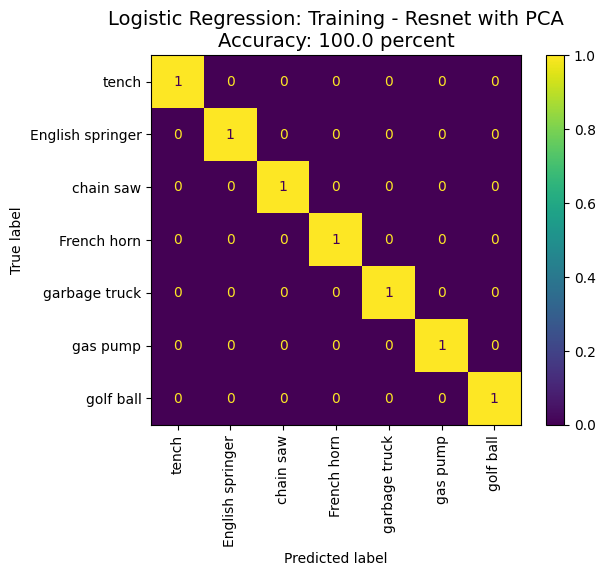

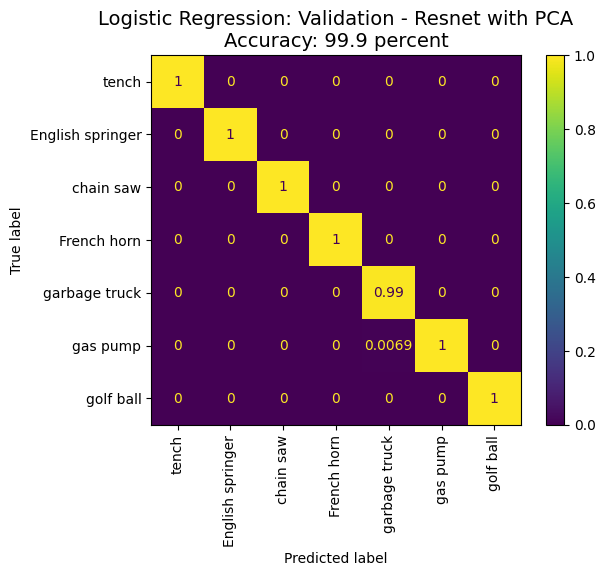

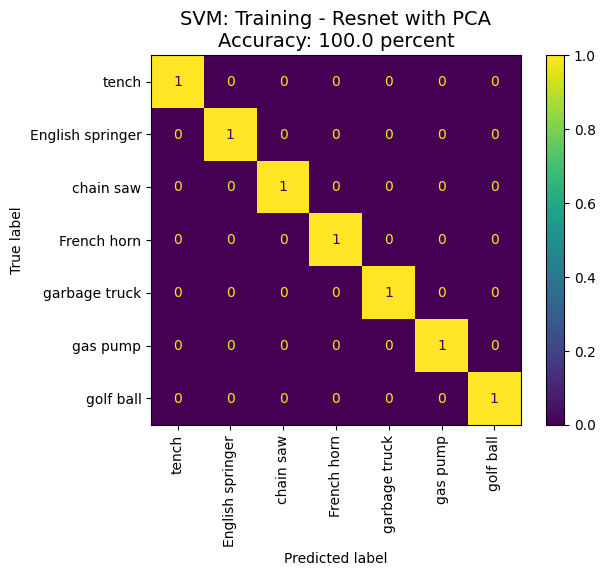

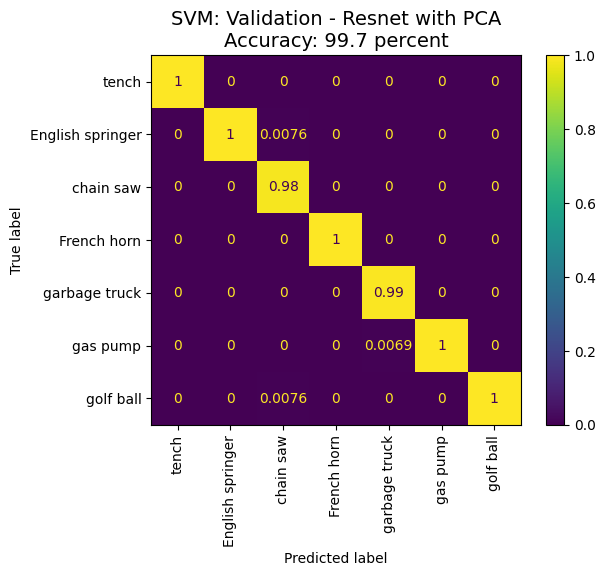

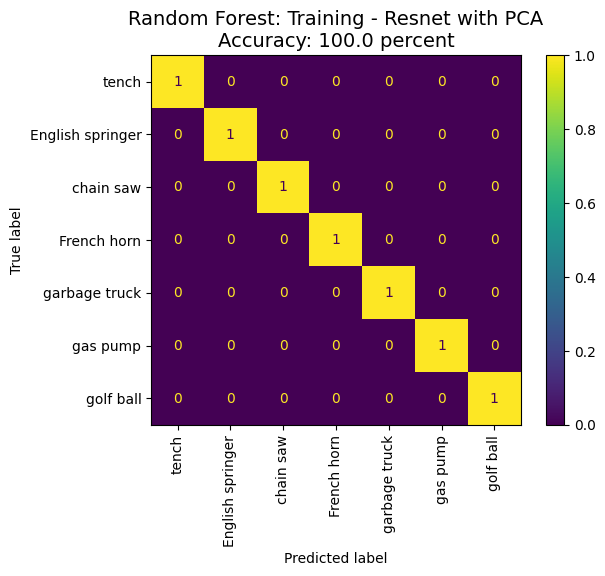

...

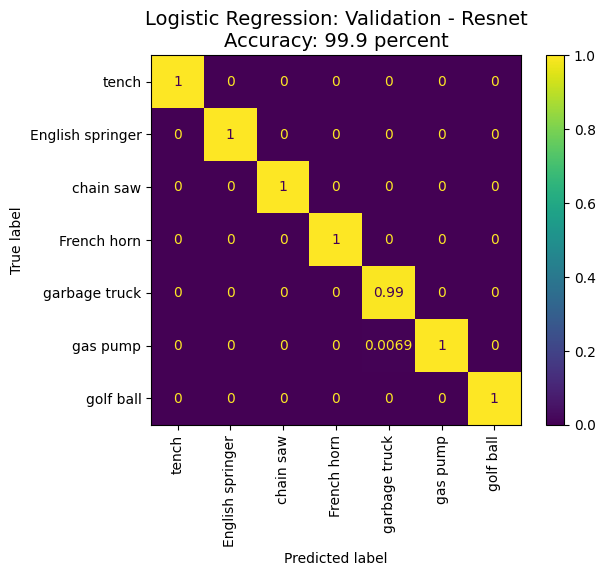

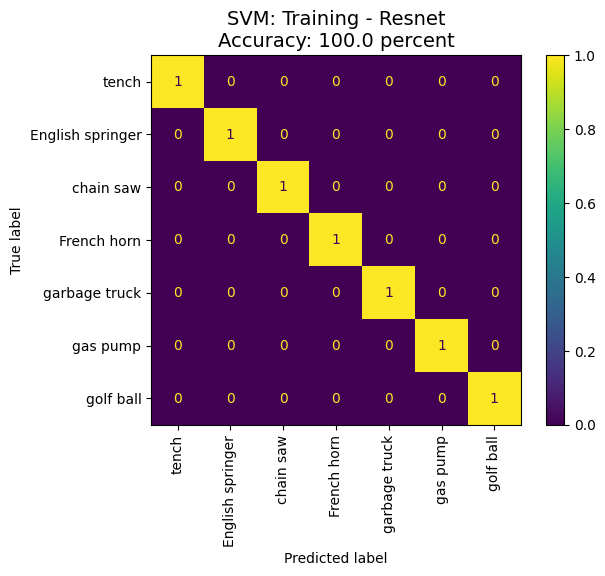

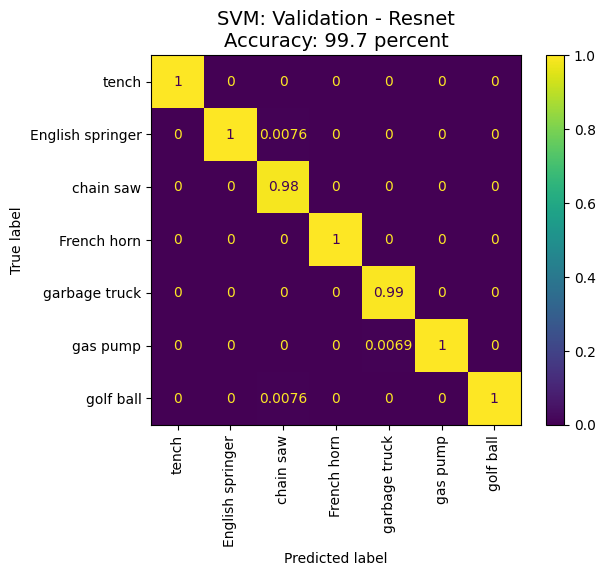

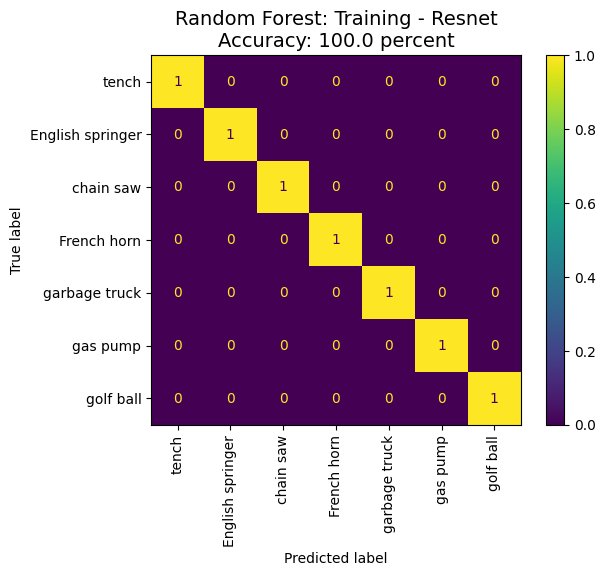

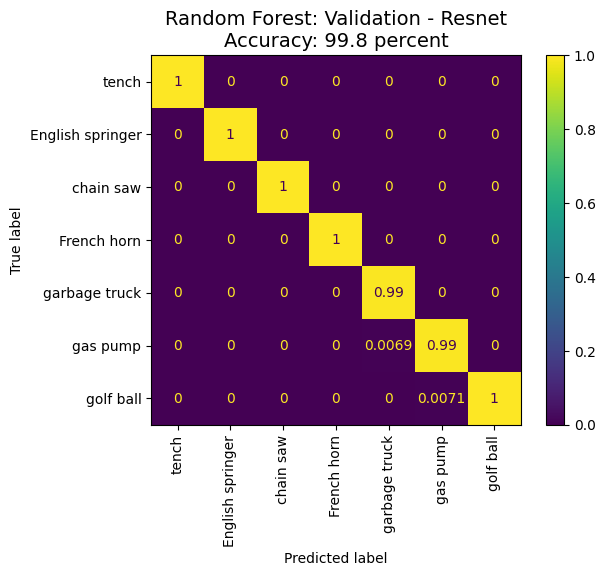

In [24]:
# Define features to input into model
feature_desc = {'Resnet with PCA': {'train': (train_resnet_pca, train['label']),
                                    'val': (val_resnet_pca, val['label']),
                                    },
                'Resnet': {'train': (train_resnet, train['label']),
                           'val': (val_resnet, val['label']),
                           },

              }

model_results_temp = {feature: {model: {} for model in model_dict.keys()} for feature in feature_desc.keys()}
model_results.update(model_results_temp)

model_results = run_model(feature_desc, model_dict, label_dict, model_results, plot_cm = True, best_params = False)


# Save most recent results
file_name = 'validation_results_cv5.pkl'

with open(file_name, 'wb') as handle:
    pickle.dump(model_results, handle, protocol=pickle.HIGHEST_PROTOCOL)

with open(file_name, 'rb') as handle:
      model_results = pickle.load(handle)

This project analyzes Imagenette images to investigate the synergy between image pre-processing, feature extraction, and classifiers in achieving accurate and timely image classifications. The diverse objects we aim to classify in this project have distinct characteristics, which encompass unique shapes and textures. We analyze the simple features from Histogram of Oriented Gradients (HOG) and Gray-Level Co-Occurrence Matrix (GLCM) as well as complex features from the pre-trained deep neural network model of  ResNet101. To reduce dimensionality, we ran all the extracted image features through Principal Component Analysis (PCA). These classification models are scrutinized to understand which parameters would optimally classify images. We discuss accuracy and efficiency of our models and examine misclassifications.




In recognition of the importance of image object categorization, researchers created ImageNet for computer vision analysis. ImageNet is a dataset consisting of millions of labeled web images with thousands of different classes. Our data is a subset of ImageNet, and was sourced from huggingface and it contains the ten classes of Church, Parachute, Cassette Player, Tench, English Springer, Chainsaw, French Horn, Garbage Truck, Gas Pump, and Golf Ball. We removed the Church, Parachute, and Cassette Player classes, as we anticipate the variability in the other classes will limit our outcomes. Each class is fairly well represented with about 1,300 images for each class, which we partion into train, validate and test sets.

Please note this notebook is adapted from a final group project for University of California, Berkeley's Computer Vision class.

# Final Run
We are running with the Simple Combined Features and Resnet Features, both with and without PCA applied.

In [25]:

feature_desc = {'Resnet with PCA': {'train': (train_resnet_pca, train['label']),
                                    'val': (val_resnet_pca, val['label']),
                                    'test': (test_resnet_pca, test['label'])
                                    },
                'Resnet': {'train': (train_resnet, train['label']),
                           'val': (val_resnet, val['label']),
                           'test': (test_resnet, test['label'])
                           },
                'Simple Combined Features with PCA': {'train': (train_comb_simple_pca, train['label']),
                                                'val': (val_comb_simple_pca, val['label']),
                                                'test': (test_comb_simple_pca, test['label'])
                                               },
                'Simple Combined Features': {'train': (train_comb_simple, train['label']),
                                      'val': (val_comb_simple, val['label']),
                                      'test': (test_comb_simple, test['label'])
                                      },

              }


model_dict = {
            'Logistic Regression':   {'estimator': LogisticRegression(),
                                      },
              'SVM':           {'estimator': SVC(),
                                },
              }


model_results_temp = {feature: {model: {} for model in model_dict.keys()} for feature in feature_desc.keys()}
model_results.update(model_results_temp)

Logistic Regression training time: 1.53 seconds
The Logistic Regression Optimized Training - Resnet with PCA is 100.0% accurate
The Logistic Regression Testing - Resnet with PCA is 99.96% accurate
SVM training time: 1.68 seconds
The SVM Optimized Training - Resnet with PCA is 100.0% accurate
The SVM Testing - Resnet with PCA is 99.39% accurate
Logistic Regression training time: 12.85 seconds
The Logistic Regression Optimized Training - Resnet is 100.0% accurate
The Logistic Regression Testing - Resnet is 99.96% accurate
SVM training time: 14.37 seconds
The SVM Optimized Training - Resnet is 100.0% accurate
The SVM Testing - Resnet is 98.99% accurate
Logistic Regression training time: 1.30 seconds
The Logistic Regression Optimized Training - Simple Combined Features with PCA is 66.02% accurate
The Logistic Regression Testing - Simple Combined Features with PCA is 59.48% accurate


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


SVM training time: 5.65 seconds
The SVM Optimized Training - Simple Combined Features with PCA is 100.0% accurate
The SVM Testing - Simple Combined Features with PCA is 63.45% accurate
Logistic Regression training time: 42.80 seconds
The Logistic Regression Optimized Training - Simple Combined Features is 85.32% accurate
The Logistic Regression Testing - Simple Combined Features is 56.59% accurate


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


SVM training time: 85.59 seconds
The SVM Optimized Training - Simple Combined Features is 100.0% accurate
The SVM Testing - Simple Combined Features is 62.8% accurate


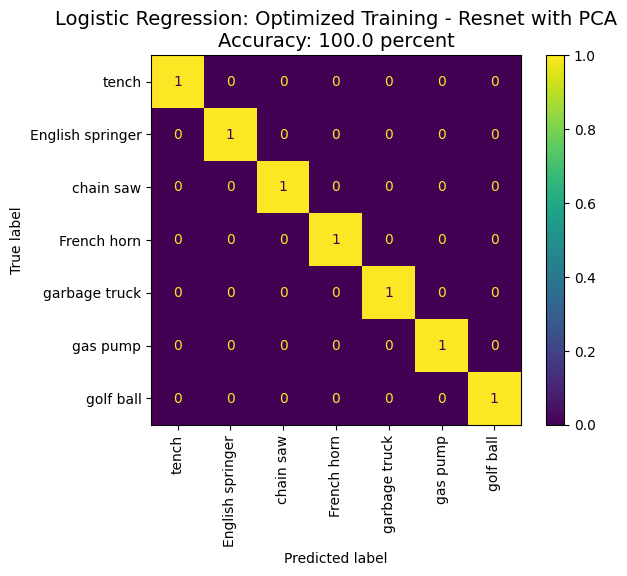

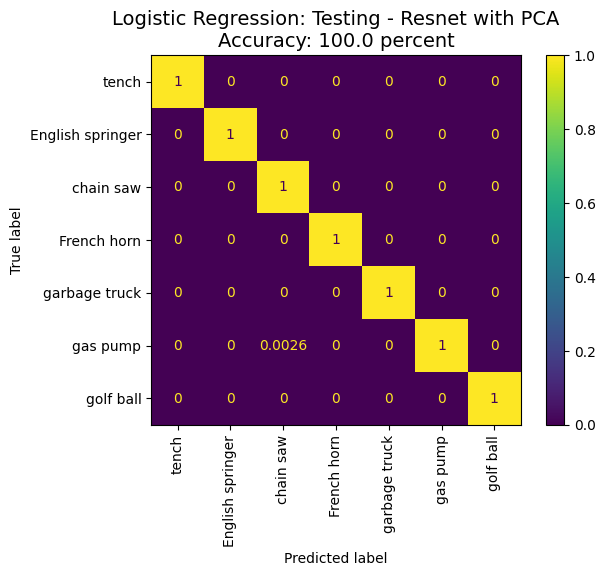

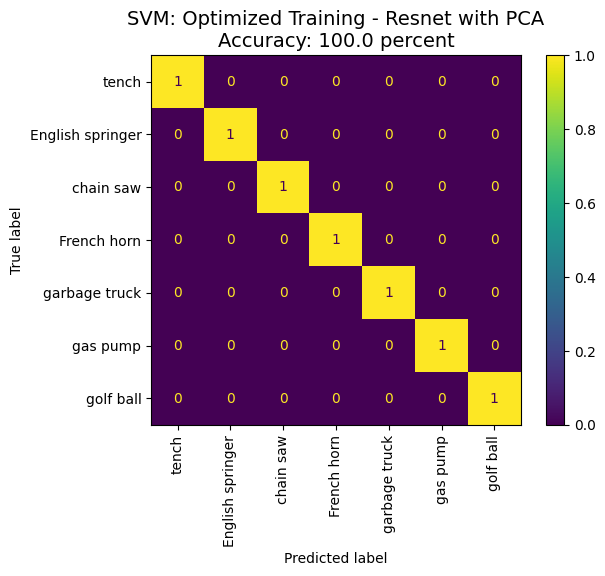

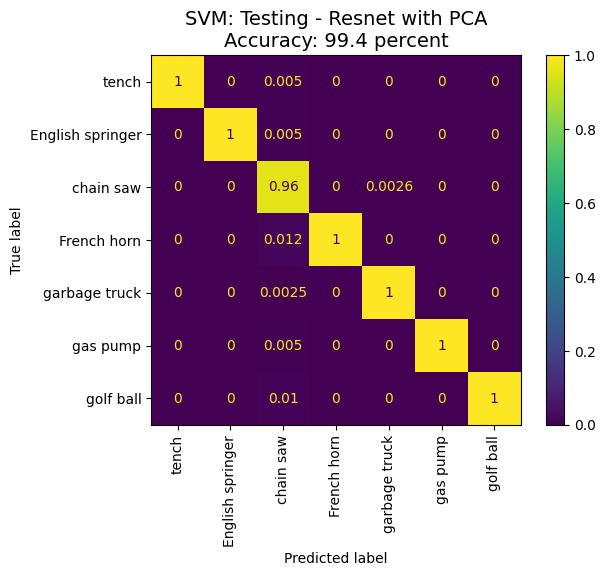

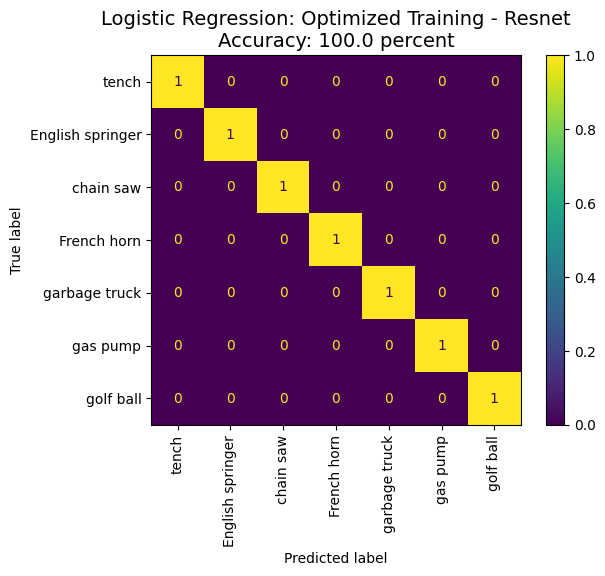

...

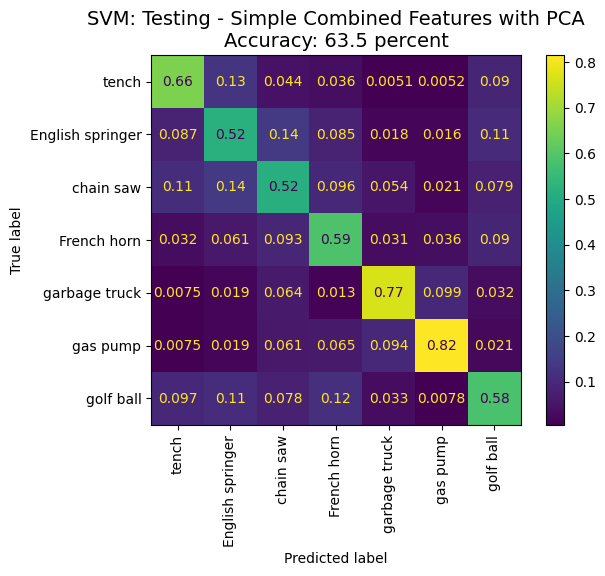

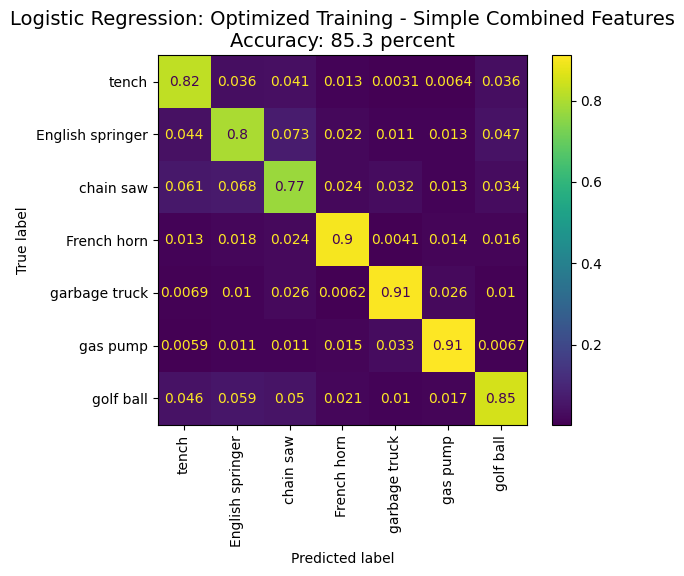

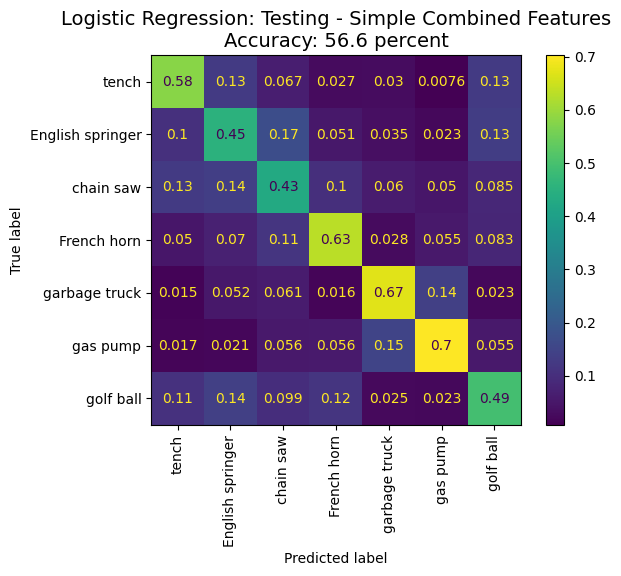

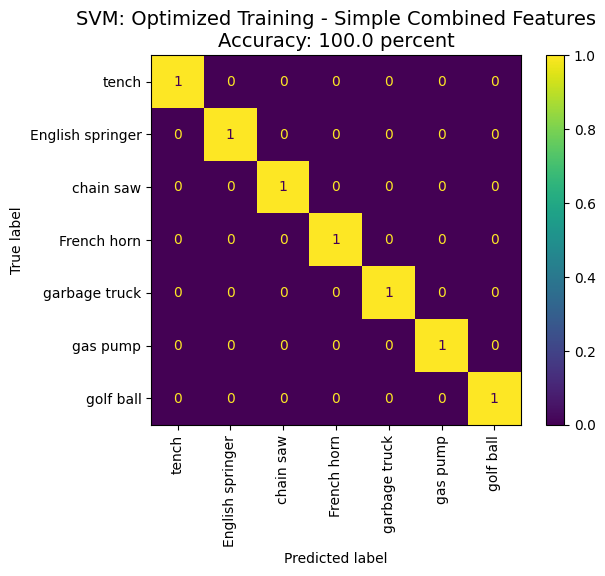

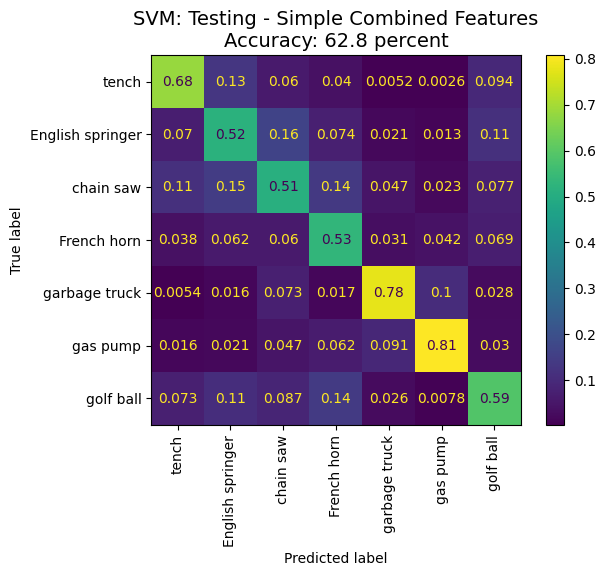

In [47]:

# add run prediction labels
for feature_name, features in feature_desc.items():
    for key, run in model_dict.items():

        # train model on concat train and val datasets
        run['train'] = np.concatenate((features['train'][0], features['val'][0]))
        run['train_labels'] = np.concatenate((features['train'][1], features['val'][1]))

        # predict using test dataset
        run['test'], run['test_labels'] = features['test']

        if "Simple Combined" in feature_name:
            params = model_results[feature_name][key]['best_params']
            run['estimator'] = run['estimator'].set_params(**params)

        # adjust titles
        run['label_dict'] = label_dict
        run['title'] = [f"Optimized Training - {feature_name}", f"Testing - {feature_name}"]

        # Save results to dictionary
        (model_results[feature_name][key]['model'],
         model_results[feature_name][key]['training_time'],
         model_results[feature_name][key]['preds'],
         model_results[feature_name][key]['inference_time']) = model_and_CM(name=key, **run, plot_cm=True, load_params = False)


In [48]:
# initialize dataframe
iterables = [list(model_results['Resnet'].keys()), ['Simple Combined Features with PCA','Simple Combined Features','Resnet with PCA','Resnet']]
index = pd.MultiIndex.from_product(iterables,
                                   names=['Classifier', 'Features'])
display_df = pd.DataFrame(index=index)

# populate from model_results dictionary
for feature, models in model_results.items():
    if "Resnet" in feature or "Simple Combined" in feature:
      print('feature', feature)
      print('models', len(models['SVM']['preds']['model_predict'][0]))
      print('_'*30)
      for model, run in models.items():
          if model == 'Random Forest':
            pass
          else:
            print(model,"LEN", len(test['label']), len(run['preds']['model_predict'][0]))
            display_df.loc[(model, feature), 'TrainVal Accuracy'] = round(accuracy_score(np.concatenate((train['label'], val['label'])), run['preds']['model_train'][0]) * 100, 1)
            display_df.loc[(model, feature), 'Test Accuracy'] = round(accuracy_score(test['label'], run['preds']['model_predict'][0]) * 100, 1)
            display_df.loc[(model, feature), 'Training Time'] = round(run['training_time'], 2)
            display_df.loc[(model, feature), 'Inference Time'] = round(run['inference_time'], 3)

display_test_df = copy.deepcopy(display_df)
display_test_df

feature Simple Combined Features with PCA
models 2769
______________________________
Logistic Regression LEN 2769 2769
SVM LEN 2769 2769
feature Simple Combined Features
models 2769
______________________________
Logistic Regression LEN 2769 2769
SVM LEN 2769 2769
feature Resnet with PCA
models 2769
______________________________
Logistic Regression LEN 2769 2769
SVM LEN 2769 2769
feature Resnet
models 2769
______________________________
Logistic Regression LEN 2769 2769
SVM LEN 2769 2769


TrainVal Accuracy  \
Classifier          Features                                               
Logistic Regression Simple Combined Features with PCA               66.0   
                    Simple Combined Features                        85.3   
                    Resnet with PCA                                100.0   
                    Resnet                                         100.0   
SVM                 Simple Combined Features with PCA              100.0   
                    Simple Combined Features                       100.0   
                    Resnet with PCA                                100.0   
                    Resnet                                         100.0   

                                                       Test Accuracy  \
Classifier          Features                                           
Logistic Regression Simple Combined Features with PCA           59.5   
                    Simple Combined Features                    56.6   
                    Resnet with PCA                            100.0   
                    Resnet                                     100.0   
SVM                 Simple Combined Features with PCA           63.5   
                    Simple Combined Features                    62.8   
                    Resnet with PCA                             99.4   
                    Resnet                                      99.0   

                                                       Training Time  \
Classifier          Features                                           
Logistic Regression Simple Combined Features with PCA           1.30   
                    Simple Combined Features                   42.80   
                    Resnet with PCA                             1.53   
                    Resnet                                     12.85   
SVM                 Simple Combined Features with PCA           5.65   
                    Simple Combined Features                   85.59   
                    Resnet with PCA                             1.68   
                    Resnet                                     14.37   

                                                       Inference Time  
Classifier          Features                                           
Logistic Regression Simple Combined Features with PCA           0.003  
                    Simple Combined Features                    0.020  
                    Resnet with PCA                             0.007  
                    Resnet                                      0.027  
SVM                 Simple Combined Features with PCA           2.587  
                    Simple Combined Features                   40.676  
                    Resnet with PCA                             0.863  
                    Resnet                                      7.627

### Test Results
The optimized parameters for Logistic Regression that were used on the test set were a C value of 0.1 and the Solver L-BFGS. C is the Regularization Parameter for adding in a penalty so with a value of 0.1 we are using a weaker regularization. We use the algorithm Limited-memory Broyden, Fletcher, Goldfarb, and Shanno (L-BFGS) for the optimization which is part of Quasi-Newton methods to find local extrema of functions

### Resnet Misclassifications
ResNet undoubtedly provides the fastest, most accurate predictions. We surmise that the model was able to pick up on these nuances of the data that were included but not central to the image. For example, for the chainsaw class, the images commonly depicted individuals wielding the chainsaw with both hands, their arms noticeably bent. One of the ResNet misclassified images that was predicted to be a chainsaw but the true label was a golf ball, had a man holding up two hands, similar to what his arms would look like if he was holding a chainsaw as shown in Figure 27. The English springer was misclassified as a garbage truck which could be because of the lighting within the image. The lightest part of the image is rectangular which could be why the image is being confused for a rectangular garbage truck. The misclassifications could be because of the additional details learned in the images.



![""]("misclassified_images.png")

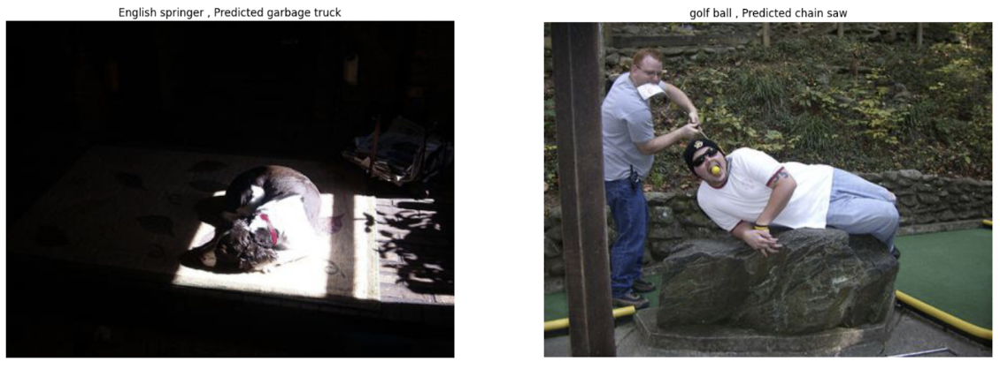

In [ ]:
Image("misclassified_images.png")

### Conclusion

While ResNet has the strongest performance metrics, it requires significantly more computational resources to achieve reasonable preprocessing times. HOG and GLCM were simple feature extraction methods that didn't provide much prediction power, even when joining the features together.

For future improvements, we would consider alternative preprocessing measures that may improve performance of our simple feature extractions. Additionally, to enhance the versatility of our classifier, we would consider the identification of multiple classes within a single image. There are several instances where more than one object existed in the image, and we could amend our classifiers to identify all potential objects.

